# DATA SCIENCE LAB

In [393]:
import pandas as pd
import glob
import os
import numpy as np
from datetime import date, timedelta

# Forecasting time series with complex seasonal patterns
from tbats import TBATS, BATS

# Load mooving average methods
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing

# Load specific forecasting tools
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.eval_measures import mse,rmse
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf # for determining (p,q) orders
from statsmodels.tsa.seasonal import seasonal_decompose      # for ETS Plots
import pmdarima                            # for determining ARIMA orders

# Load specific clustering tools
from minisom import MiniSom
from tslearn.barycenters import dtw_barycenter_averaging
from tslearn.clustering import TimeSeriesKMeans
from sklearn.cluster import KMeans

# Load specific evaluation tools
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse

# Load fbprophet
from fbprophet import Prophet

import matplotlib.pyplot as plt
import math
from datetime import date, timedelta
import dateutil.relativedelta as relativedelta
import holidays

# Ignore harmless warnings
import warnings
warnings.filterwarnings("ignore")

pd.options.plotting.backend = 'matplotlib'
plt.style.use('default')

## Import Dati

In [2]:
frame = pd.read_csv('https://raw.githubusercontent.com/GianlucaSimionato/Data_Science_Lab/main/DB.csv', sep=';', decimal=',')

In [271]:
frame.sort_values(by=['POD', 'DATE_TIME_MIN'], inplace=True)
frame['DATE_TIME'] = pd.to_datetime({'year':frame['YEAR'], 'month':frame['MONTH'], 'DAY':frame['DAY'], 'HOUR':frame['HOUR']})

In [272]:

frame

,POD,DATA,ORA,CONSUMO_ATTIVA_PRELEVATA,MINUTE,HOUR,YEAR,MONTH,DAY,DATE_TIME_MIN,DATE_TIME
101748,IT012E00491824,20180101,0,93.50,0,0,2018,1,1,2018-01-01 00:00:00,2018-01-01 00:00:00
101749,IT012E00491824,20180101,1500,91.30,15,0,2018,1,1,2018-01-01 00:15:00,2018-01-01 00:00:00
101750,IT012E00491824,20180101,3000,91.85,30,0,2018,1,1,2018-01-01 00:30:00,2018-01-01 00:00:00
101751,IT012E00491824,20180101,4500,90.20,45,0,2018,1,1,2018-01-01 00:45:00,2018-01-01 00:00:00
101752,IT012E00491824,20180101,10000,91.85,0,1,2018,1,1,2018-01-01 01:00:00,2018-01-01 01:00:00
...,...,...,...,...,...,...,...,...,...,...,...
172290,IT012E00491869,20201231,224500,54.00,45,22,2020,12,31,2020-12-31 22:45:00,2020-12-31 22:00:00
172291,IT012E00491869,20201231,230000,53.40,0,23,2020,12,31,2020-12-31 23:00:00,2020-12-31 23:00:00
172292,IT012E00491869,20201231,231500,54.60,15,23,2020,12,31,2020-12-31 23:15:00,2020-12-31 23:00:00
172293,IT012E00491869,20201231,233000,55.20,30,23,2020,12,31,2020-12-31 23:30:00,2020-12-31 23:00:00


In [273]:
start = frame.DATE_TIME.min()
end = frame.DATE_TIME.max().date()
start, end

(Timestamp('2018-01-01 00:00:00'), datetime.date(2020, 12, 31))

In [274]:
df_cal = pd.DataFrame({"Date": pd.date_range(start, end)})
df_cal["Day"] = df_cal['Date'].dt.day_name()
df_cal["Week"] = df_cal['Date'].dt.weekofyear
df_cal["Month"] = df_cal['Date'].dt.month
df_cal["Month_name"] = df_cal['Date'].dt.month_name()
df_cal["Quarter"] = df_cal['Date'].dt.quarter
df_cal["Year"] = df_cal['Date'].dt.year
df_cal


,Date,Day,Week,Month,Month_name,Quarter,Year
0,2018-01-01,Monday,1,1,January,1,2018
1,2018-01-02,Tuesday,1,1,January,1,2018
2,2018-01-03,Wednesday,1,1,January,1,2018
3,2018-01-04,Thursday,1,1,January,1,2018
4,2018-01-05,Friday,1,1,January,1,2018
...,...,...,...,...,...,...,...
1091,2020-12-27,Sunday,52,12,December,4,2020
1092,2020-12-28,Monday,53,12,December,4,2020
1093,2020-12-29,Tuesday,53,12,December,4,2020
1094,2020-12-30,Wednesday,53,12,December,4,2020


In [275]:
year_list = list(df_cal["Year"].unique())
year_list.append(df_cal["Year"].max()+1)
year_list

[2018, 2019, 2020, 2021]

In [276]:
holiday_date = []
holiday_name = []
year_list =  list(df_cal["Year"].unique())
year_list.append(df_cal["Year"].max()+1)
for ptr in holidays.IT(years = year_list, prov='MI').items():
    holiday_date.append(ptr[0])
    holiday_name.append(ptr[1])
df_holiday = pd.DataFrame(list(zip(holiday_date, holiday_name)), columns =['Date', 'holiday_name'])
df_holiday['Date'] = pd.to_datetime(df_holiday['Date'])

In [277]:
df_cal_holiday = pd.merge(df_cal, df_holiday, how='left', on='Date')
df_cal_holiday['dummy_holiday'] = np.where(df_cal_holiday['holiday_name']==df_cal_holiday['holiday_name'], 1, 0)
df_cal_holiday['dummy_Covid'] = np.where(df_cal_holiday['Date'] > '2020-03-01', 1, 0)
df_cal_holiday[df_cal_holiday['dummy_holiday']==1]

,Date,Day,Week,Month,Month_name,Quarter,Year,holiday_name,dummy_holiday,dummy_Covid
0,2018-01-01,Monday,1,1,January,1,2018,Capodanno,1,0
5,2018-01-06,Saturday,1,1,January,1,2018,Epifania del Signore,1,0
90,2018-04-01,Sunday,13,4,April,2,2018,Pasqua di Resurrezione,1,0
91,2018-04-02,Monday,14,4,April,2,2018,Lunedì dell'Angelo,1,0
114,2018-04-25,Wednesday,17,4,April,2,2018,Festa della Liberazione,1,0
120,2018-05-01,Tuesday,18,5,May,2,2018,Festa dei Lavoratori,1,0
152,2018-06-02,Saturday,22,6,June,2,2018,Festa della Repubblica,1,0
226,2018-08-15,Wednesday,33,8,August,3,2018,Assunzione della Vergine,1,0
304,2018-11-01,Thursday,44,11,November,4,2018,Tutti i Santi,1,0
340,2018-12-07,Friday,49,12,December,4,2018,Sant'Ambrogio,1,0


In [278]:
frame_grouped = frame.groupby(['POD', 'YEAR', 'MONTH', 'DAY', 'HOUR'], as_index=False).mean()
frame_grouped['DATE_TIME'] = pd.to_datetime({'year':frame_grouped['YEAR'], 'month':frame_grouped['MONTH'], 'DAY':frame_grouped['DAY'], 'HOUR':frame_grouped['HOUR']})
frame_grouped = frame_grouped[['POD', 'CONSUMO_ATTIVA_PRELEVATA', 'DATE_TIME']]
frame_hour = frame_grouped.set_index('DATE_TIME')
df_complete_POD1 = frame_hour[frame_hour['POD'] == 'IT012E00491869'][['CONSUMO_ATTIVA_PRELEVATA']]

In [279]:
frame_g = frame.groupby(['POD', 'YEAR', 'MONTH', 'DAY'], as_index=False).mean()
frame_g['DATE_TIME'] = pd.to_datetime({'year':frame_g['YEAR'], 'month':frame_g['MONTH'], 'DAY':frame_g['DAY']})
frame_g = frame_g[['POD', 'CONSUMO_ATTIVA_PRELEVATA', 'DATE_TIME']]
frame_g = frame_g.set_index('DATE_TIME')


In [280]:
POD_1 = 'IT012E00491869'
df_1 = frame_g[frame_g['POD'] == POD_1]
df_1.sort_index(ascending=True, inplace=True)
df_1 = df_1[['CONSUMO_ATTIVA_PRELEVATA']]
POD_2 = 'IT012E00491824'
df_2 = frame_g[frame_g['POD'] == POD_2]
df_2.sort_index(ascending=True, inplace=True)
df_2 = df_2[['CONSUMO_ATTIVA_PRELEVATA']]

In [281]:
df_2['year']=df_2.index.year.astype(str)
df_2['Month']=df_2.index.month.astype(str)
df_2['Day']=df_2.index.weekday.astype(str)

df_1['year']=df_1.index.year.astype(str)
df_1['Month']=df_1.index.month.astype(str)
df_1['Day']=df_1.index.weekday.astype(str)

## Visualizzazione Dati

<AxesSubplot:title={'center':'CONSUMO_ATTIVA_PRELEVATA'}, xlabel='[year]'>

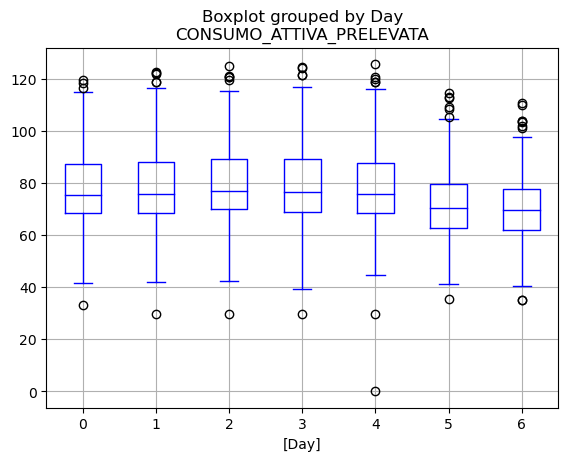

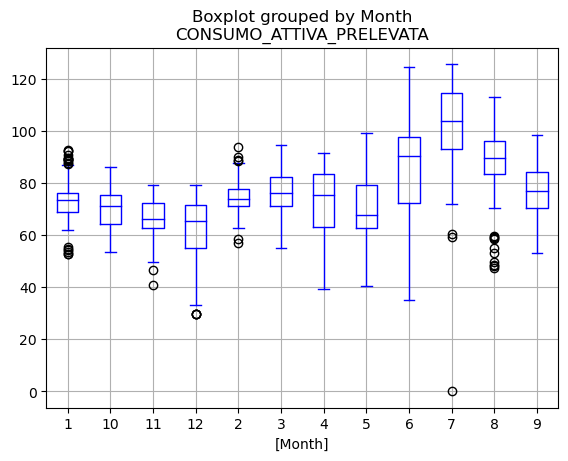

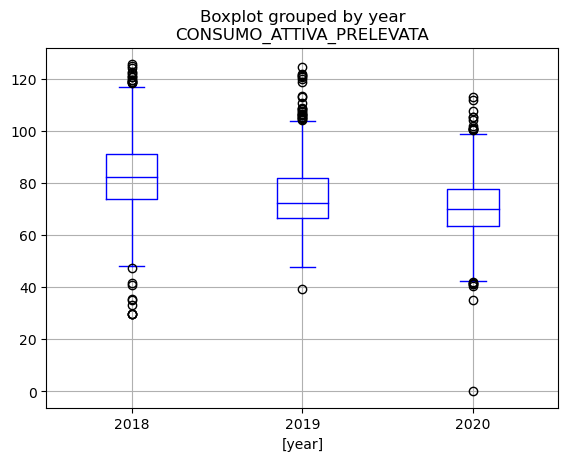

In [282]:
# BOXPLOT
df_1.boxplot(by='Day', color='blue')
df_1.boxplot(by='Month', color='blue')
df_1.boxplot(by='year', color='blue')

<AxesSubplot:title={'center':'CONSUMO_ATTIVA_PRELEVATA'}, xlabel='[year]'>

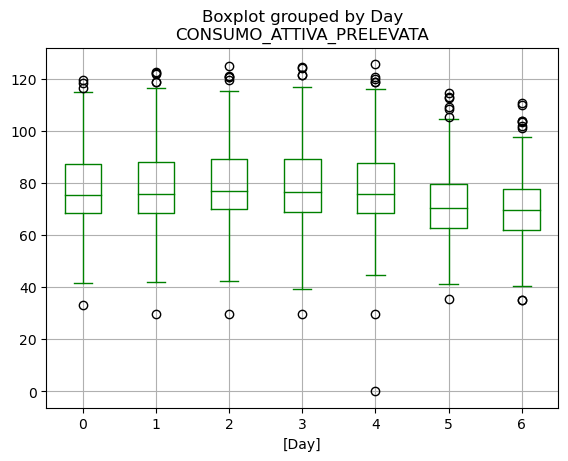

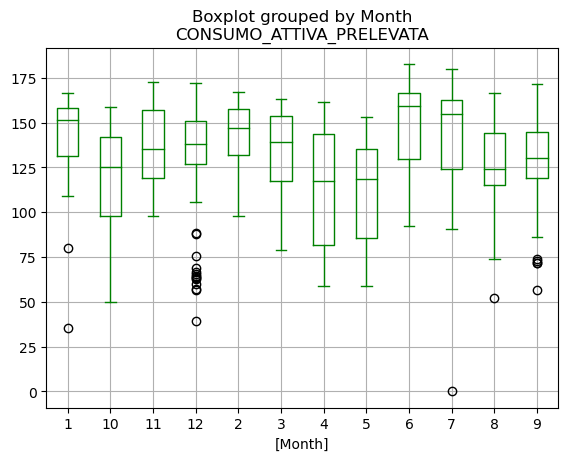

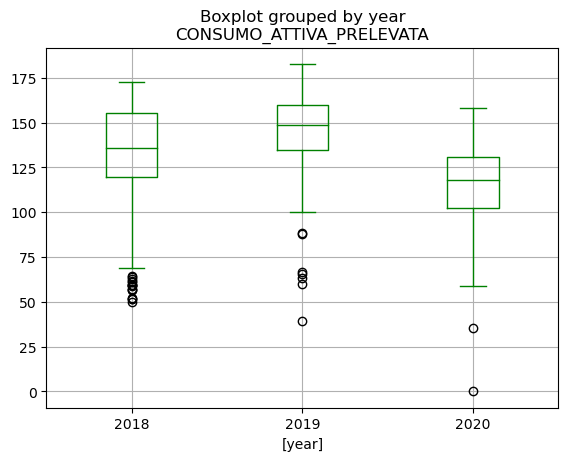

In [283]:
df_1.boxplot(by='Day', color='green')
df_2.boxplot(by='Month', color='green')
df_2.boxplot(by='year', color='green')

<AxesSubplot:xlabel='DATE_TIME'>

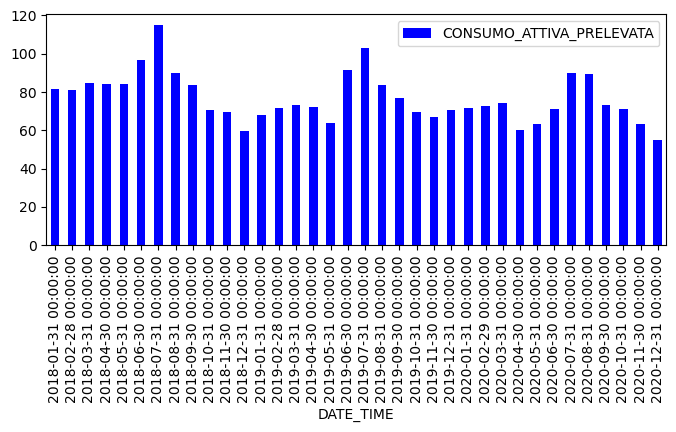

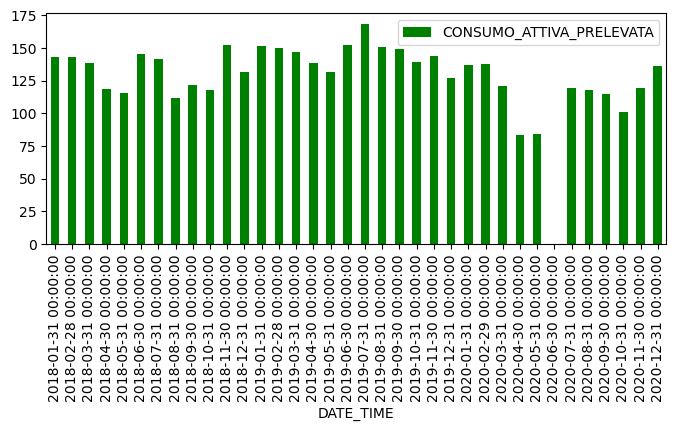

In [284]:
#BAR CHART
df_1.resample('M').mean().plot.bar(figsize=(8,3), color='blue')
df_2.resample('M').mean().plot.bar(figsize=(8,3), color='green')

In [285]:
df_cal_holiday.set_index('Date', inplace=True)


In [286]:
df_1 = pd.merge(df_1, df_cal_holiday[['dummy_holiday', 'dummy_Covid']], left_index=True, right_index=True)

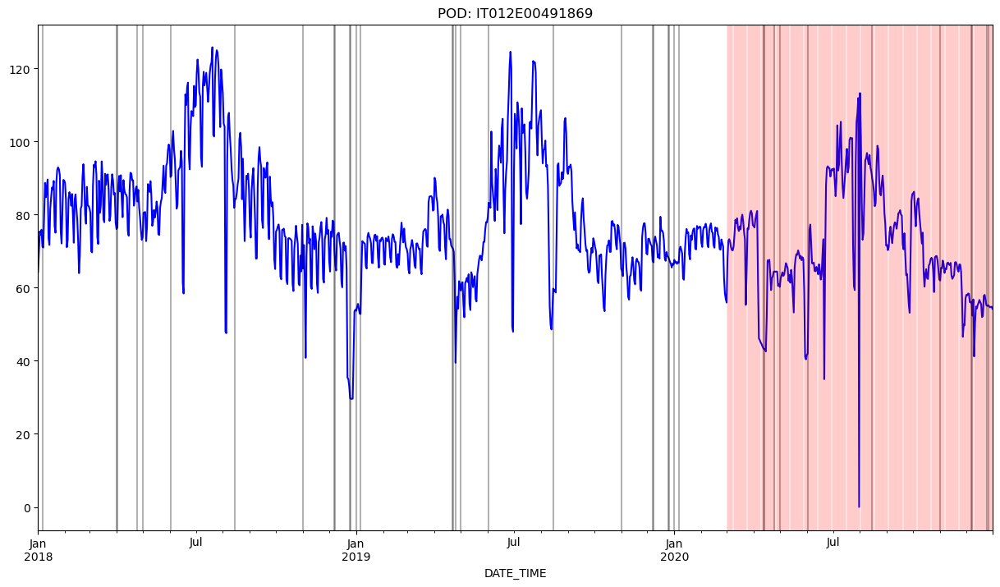

In [287]:
#LINE CHARET
ax = df_1['CONSUMO_ATTIVA_PRELEVATA'].resample('d').mean().plot(figsize=(15,8), color='blue', title = 'POD: IT012E00491869')
ax.autoscale(axis='x',tight=True)
for x in df_1.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3)
for x in df_1.query('dummy_Covid==1').index: 
    ax.axvline(x=x, color='r', alpha = 0.1);


In [288]:
df_2 = pd.merge(df_2, df_cal_holiday[['dummy_holiday', 'dummy_Covid']], left_index=True, right_index=True)

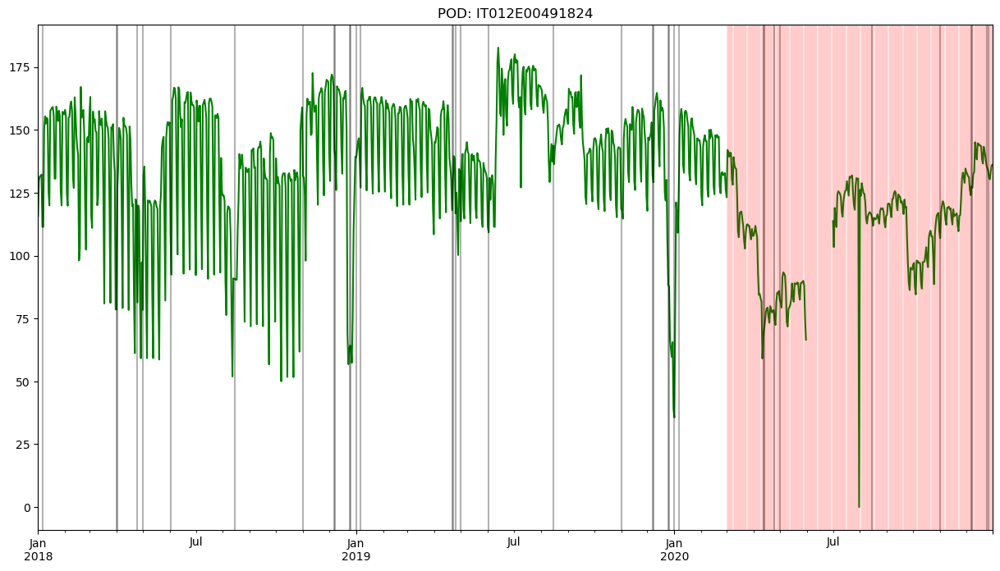

In [289]:
#LINE CHARET
ax = df_2['CONSUMO_ATTIVA_PRELEVATA'].resample('d').mean().plot(figsize=(15,8), color='green', title = 'POD: IT012E00491824')
ax.autoscale(axis='x',tight=True)
for x in df_2.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3);
for x in df_1.query('dummy_Covid==1').index: 
    ax.axvline(x=x, color='r', alpha = 0.1);

In [290]:
df = df_1.copy()

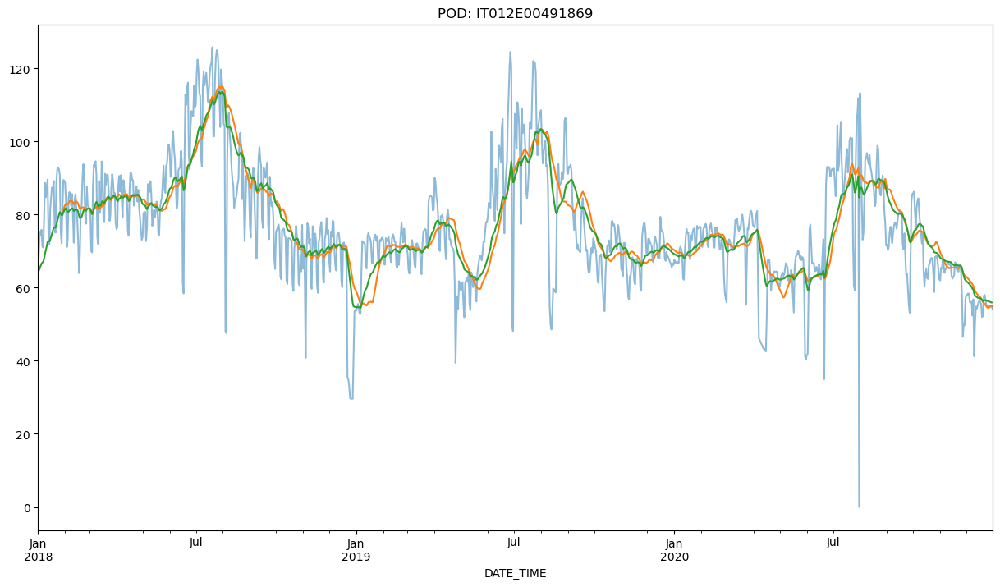

In [291]:

# MEDIE MOBILI
df['SMA30'] = df['CONSUMO_ATTIVA_PRELEVATA'].rolling(window = 30).mean()
df['SES30'] = SimpleExpSmoothing(df['CONSUMO_ATTIVA_PRELEVATA']).fit(smoothing_level=2/(30+1),optimized=False).fittedvalues.shift(-1)
df['CONSUMO_ATTIVA_PRELEVATA'].plot(figsize=(15,8), alpha=0.5, title = 'POD: IT012E00491869').autoscale(axis='x',tight=True)
df['SMA30'].plot(figsize=(15,8)).autoscale(axis='x',tight=True)
df['SES30'].plot(figsize=(15,8)).autoscale(axis='x',tight=True)


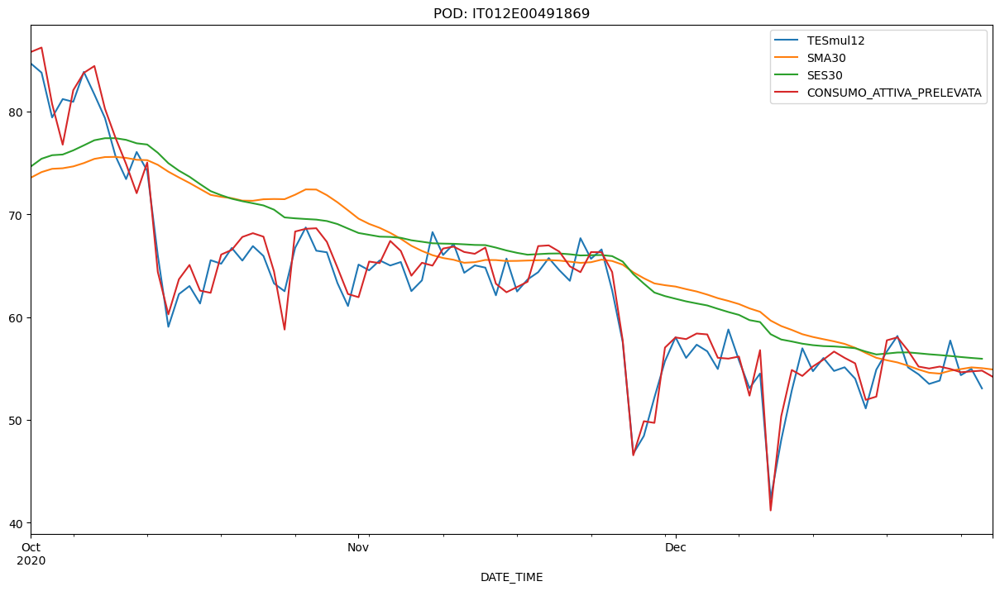

In [292]:
df = df.loc['2020-10-01':]
df['TESmul12'] = ExponentialSmoothing(df['CONSUMO_ATTIVA_PRELEVATA'], trend='mul', seasonal='mul',seasonal_periods = 7).fit().fittedvalues.shift(-1)
df[['TESmul12', 'SMA30', 'SES30', 'CONSUMO_ATTIVA_PRELEVATA']].plot(figsize=(15,8), title = 'POD: IT012E00491869').autoscale(axis='x', tight=True);

In [293]:
df = df_2.copy()

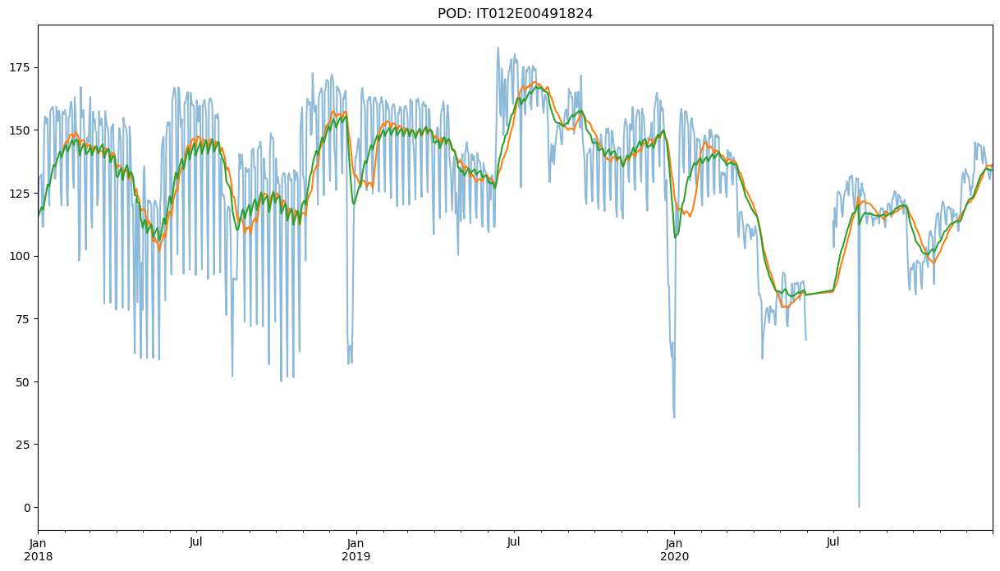

In [294]:
# MEDIE MOBILI
df['SMA30'] = df['CONSUMO_ATTIVA_PRELEVATA'].rolling(window = 30).mean()
df['SES30'] = SimpleExpSmoothing(df['CONSUMO_ATTIVA_PRELEVATA']).fit(smoothing_level=2/(30+1),optimized=False).fittedvalues.shift(-1)
df['CONSUMO_ATTIVA_PRELEVATA'].resample('d').mean().plot(figsize=(15,8), alpha=0.5, title = 'POD: IT012E00491824').autoscale(axis='x',tight=True)
df['SMA30'].plot(figsize=(15,8)).autoscale(axis='x',tight=True)
df['SES30'].plot(figsize=(15,8)).autoscale(axis='x',tight=True)

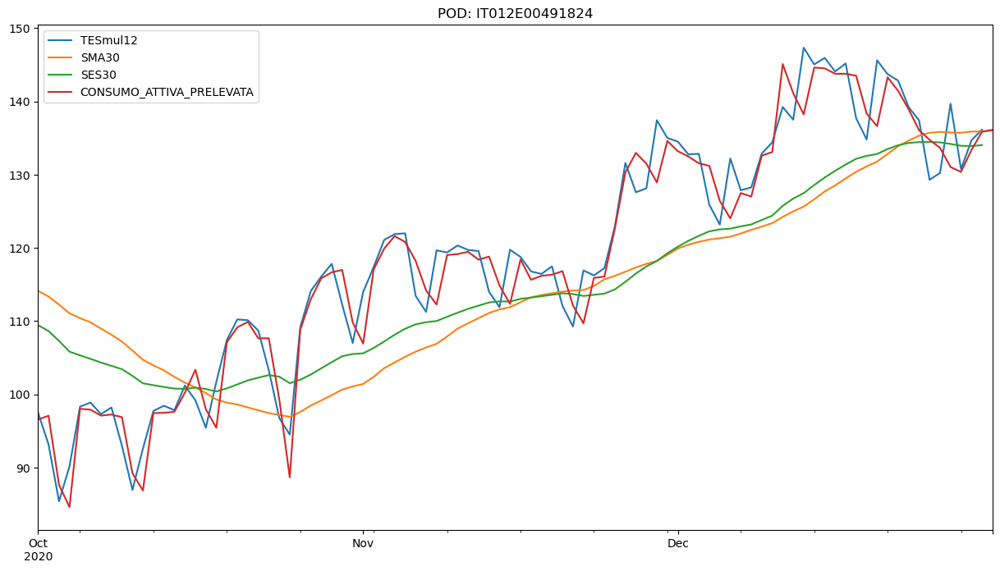

In [295]:
df = df.loc['2020-10-01':]
df['TESmul12'] = ExponentialSmoothing(df['CONSUMO_ATTIVA_PRELEVATA'], trend='mul', seasonal='mul',seasonal_periods = 7).fit().fittedvalues.shift(-1)
df[['TESmul12', 'SMA30', 'SES30', 'CONSUMO_ATTIVA_PRELEVATA']].plot(figsize=(15,8), title = 'POD: IT012E00491824').autoscale(axis='x', tight=True);

## Forecasting


Facciamo una previsione sui dati mancanti di Giugno-20

### SARIMA 
Forecat Mensile

In [40]:
frame_MONTH = frame.groupby(['POD', 'YEAR', 'MONTH'], as_index=False).mean()
df = frame_MONTH[frame_MONTH['POD'] == 'IT012E00491824']
df['DATE_TIME'] = pd.to_datetime({'year':df['YEAR'], 'month':df['MONTH'], 'day':'01'})
df = df.set_index('DATE_TIME')
df = df[['CONSUMO_ATTIVA_PRELEVATA']]
df.sort_index(ascending=True, inplace=True)
df.columns = ['Y']
df_orig = df.copy()

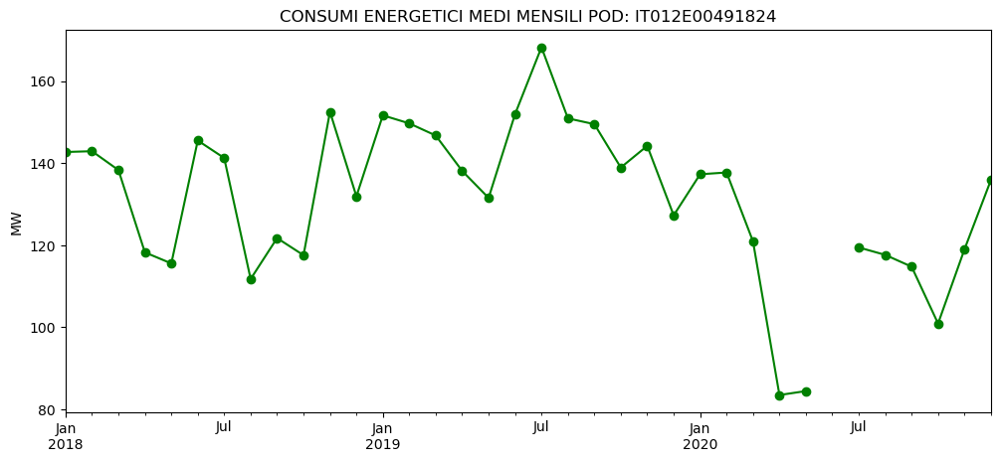

In [41]:
# Plot the source data
title='CONSUMI ENERGETICI MEDI MENSILI POD: IT012E00491824'
ylabel='MW'
xlabel='' 
ax = df.resample('MS').mean().plot(figsize=(12,5),title=title, color = 'green', marker='o', legend=False)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);


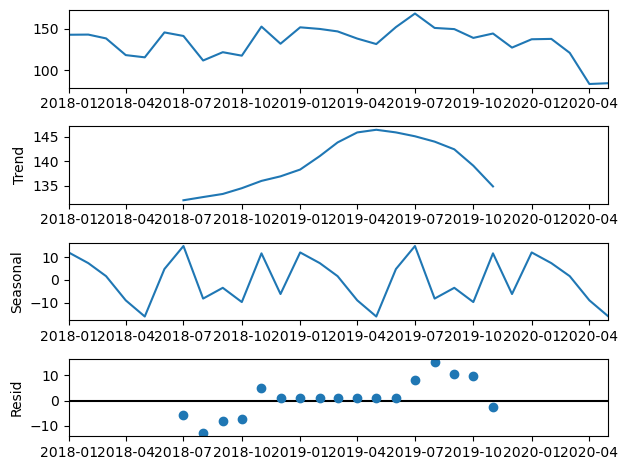

In [42]:
# ETS Decomposition
df = df.loc['2018-01-01' : '2020-05-01']
df.index.freq = 'MS'
result = seasonal_decompose(df, model='add')
result.plot();

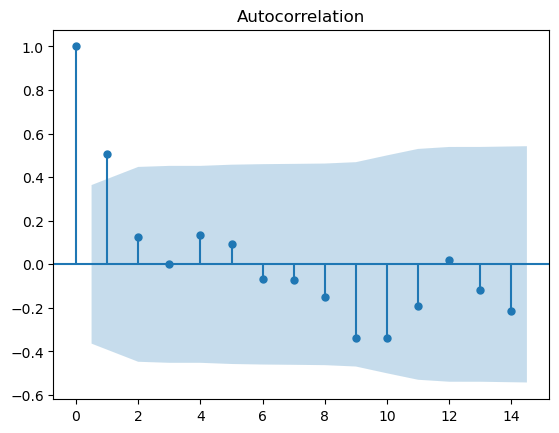

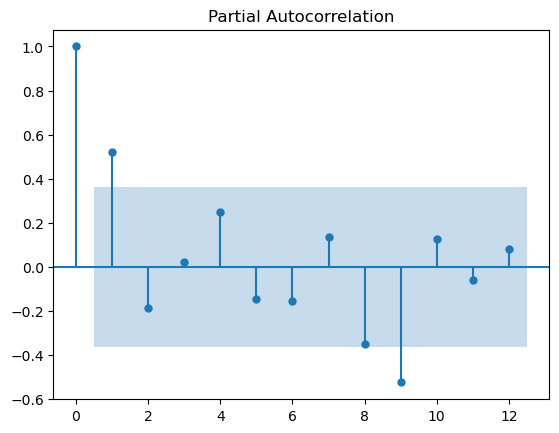

In [43]:
# Draw ACF and PACF Plot Charts
plot_acf(df.values.squeeze(), lags=14)
plot_pacf(df.values.squeeze(), lags=12)
plt.show()

In [44]:
Msarima = pmdarima.auto_arima(df['Y'], seasonal=True, m=12)

In [45]:
Msarima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   29
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 12)   Log Likelihood                -118.045
Date:                            Sun, 02 May 2021   AIC                            244.091
Time:                                    15:39:13   BIC                            249.560
Sample:                                         0   HQIC                           245.804
                                             - 29                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     10.8301     13.505      0.802      0.423     -15.639      37.299
ar.L1          0.7881      0.185      4.263      0.000       0.426       1.150
ar.S.L12       0.5970      0.240      2.492      0.013       0.127       1.067
sigma2       161.5237     50.106      3.224      0.001      63.317     259.730
===================================================================================
Ljung-Box (L1) (Q):                   0.13   Jarque-Bera (JB):                 1.37
Prob(Q):                              0.72   Prob(JB):                         0.50
Heteroskedasticity (H):               1.38   Skew:                            -0.31
Prob(H) (two-sided):                  0.62   Kurtosis:                         3.87
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [46]:
# Run pmdarima.auto_arima to obtain recommended orders
par = Msarima.get_params()
order = par['order']
seasonal_order = par['seasonal_order']

In [47]:
# Train the model on the full data and forecast one year into the future
model = SARIMAX(df['Y'], order=order, seasonal_order=seasonal_order)
results = model.fit()
fcast = results.predict(len(df), len(df), typ='levels').rename(f'SARIMA Forecast')

In [48]:
fcast

2020-06-01    98.826581
Freq: MS, Name: SARIMA Forecast, dtype: float64

In [49]:
df_merge = pd.merge(df_orig, fcast, left_index=True, right_index=True, how='outer')
df_merge['Y'].loc['2020-06-01'] = df_merge['SARIMA Forecast'].loc['2020-06-01']

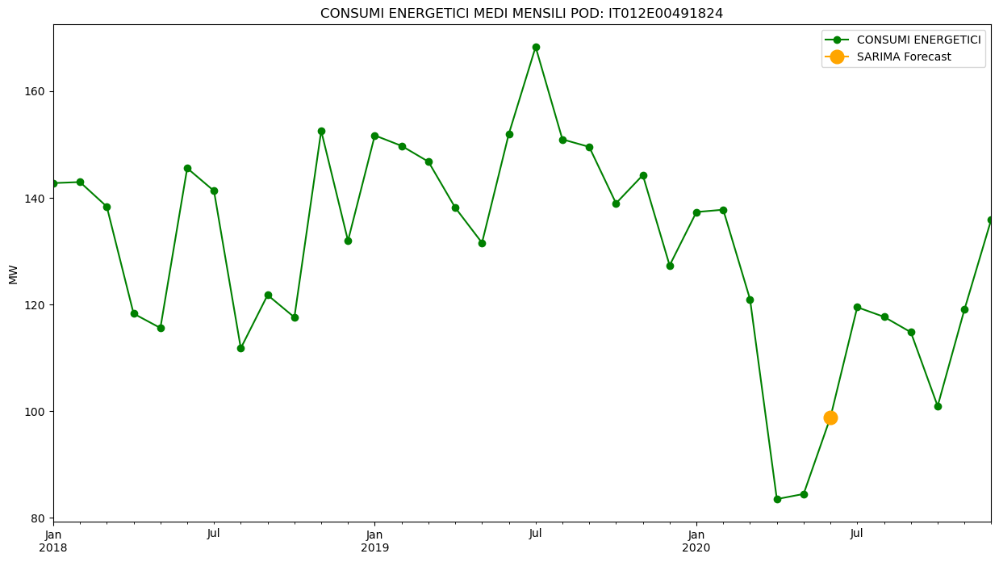

In [50]:
# Plot the forecasted values alongside the original data
title='CONSUMI ENERGETICI MEDI MENSILI POD: IT012E00491824'
ylabel='MW'
xlabel='' 
df_merge.columns = ['CONSUMI ENERGETICI', 'SARIMA Forecast']
ax = df_merge['CONSUMI ENERGETICI'].plot(legend=True,figsize=(15,8),title=title, color = 'green', marker='o')
df_merge['SARIMA Forecast'].plot(legend=True,title=title, marker='o', markersize=12, color = 'orange')
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);

## TBATS
Exponential smoothing state space model with Box-Cox transformation, ARMA errors, Trend and Seasonal components,  
TBATS do not allow for exogenous variables,     
https://pkg.robjhyndman.com/forecast/reference/tbats.html

Previsione giornaliera su Giugno-20

In [52]:
frame_MONTH = frame.groupby(['POD', 'YEAR', 'MONTH', 'DAY'], as_index=False).mean()
df = frame_MONTH[frame_MONTH['POD'] == 'IT012E00491824']
df['DATE_TIME'] = pd.to_datetime({'year' : df['YEAR'], 'month' : df['MONTH'], 'day' : df['DAY']})
df = df.set_index('DATE_TIME')
df = df[['CONSUMO_ATTIVA_PRELEVATA']]
df.sort_index(ascending = True, inplace = True)
df.columns = ['Y']
df_complete = df.copy()
df = df.loc[: '2020-05-30']

In [53]:
# TBATS model
estimator = TBATS(seasonal_periods=(7, 365))
model = estimator.fit(df)
y_forecast = model.forecast(steps=365)

In [55]:
l = []
sdate = date(2020, 6, 1)   # start date
edate = date(2021, 6, 1)   # end date
delta = edate - sdate       # as timedelta

for i in range(delta.days + 1):
    day = sdate + timedelta(days=i)
    l.append(day)

In [56]:
df_prev = pd.DataFrame(list(zip(l, y_forecast)), columns =['DATA', 'Y'])
df_prev = df_prev.set_index(pd.DatetimeIndex(df_prev['DATA']))
df_prev = df_prev.drop(['DATA'], axis=1)

In [57]:
df_prev_jun = df_prev.loc['2020-06-01': '2020-07-01']

In [58]:

df_for = pd.concat([df.loc[ : '2020-05-31'], df_prev_jun], axis=0)
df_for = df_for.loc['2020-06-01': '2020-06-30']

In [59]:
df_complete_tot = df_complete.copy()
df_complete_tot.columns = ['Y']
df_complete_tot_1 = df_complete_tot.loc[: '2020-05-31']
df_complete_tot_2 = df_complete_tot.loc['2020-07-01' :]
df_complete_tot = pd.concat([df_complete_tot_1, df_for, df_complete_tot_2], axis=0)
df_complete_tot.loc['2020-06-01':]

,Y
2020-06-01,66.758502
2020-06-02,94.937074
2020-06-03,91.834539
2020-06-04,89.771112
2020-06-05,95.141687
...,...
2020-12-27,131.037500
2020-12-28,130.367187
2020-12-29,133.375000
2020-12-30,135.855729


Trovaimo la distribuzione media delle ore all'intenro della giornata da applicare a Giugno-20

In [60]:
frame_grouped = frame.groupby(['POD', 'YEAR', 'MONTH', 'DAY', 'HOUR'], as_index=False).mean()
frame_hour = frame_grouped[frame_grouped['POD'] == 'IT012E00491824']

In [61]:
frame_hour_mean = frame_hour.groupby('HOUR', as_index=False).mean()[['HOUR', 'CONSUMO_ATTIVA_PRELEVATA']]
cons_medio = frame_hour_mean['CONSUMO_ATTIVA_PRELEVATA'].mean()
frame_hour_mean['PESO_CONSUMO'] = frame_hour_mean['CONSUMO_ATTIVA_PRELEVATA'] / cons_medio
frame_hour_mean

,HOUR,CONSUMO_ATTIVA_PRELEVATA,PESO_CONSUMO
0,0,107.354092,0.817233
1,1,106.736245,0.812529
2,2,106.783173,0.812887
3,3,107.007505,0.814594
4,4,111.820263,0.851232
5,5,112.457845,0.856085
6,6,115.742624,0.881091
7,7,135.943644,1.034871
8,8,151.984967,1.156985
9,9,154.346588,1.174963


In [62]:
df_for = df_for.reset_index()


In [63]:
df_for['FLAG'] = 'Y'
frame_hour_mean['FLAG'] = 'Y'
df_for_hour = pd.merge(df_for, frame_hour_mean, on = 'FLAG', how = 'left')
df_for_hour['CONSUMO_STIMATO'] = df_for_hour['Y'] * df_for_hour['PESO_CONSUMO']
df_for_hour['YEAR'] = df_for_hour['index'].dt.year
df_for_hour['MONTH'] = df_for_hour['index'].dt.month
df_for_hour['DAY'] = df_for_hour['index'].dt.day
df_for_hour['DATE_TIME'] = pd.to_datetime({'year':df_for_hour['YEAR'], 'month':df_for_hour['MONTH'], 'DAY':df_for_hour['DAY'], 'HOUR':df_for_hour['HOUR']})
df_for_hour = df_for_hour[['DATE_TIME', 'CONSUMO_STIMATO']]
df_for_hour = df_for_hour.set_index('DATE_TIME')

In [64]:
frame_grouped = frame.groupby(['POD', 'YEAR', 'MONTH', 'DAY', 'HOUR'], as_index=False).mean()
frame_hour = frame_grouped[frame_grouped['POD'] == 'IT012E00491824']
frame_hour['DATE_TIME'] = pd.to_datetime({'year':frame_hour['YEAR'], 'month':frame_hour['MONTH'], 'DAY':frame_hour['DAY'], 'HOUR':frame_hour['HOUR']})
frame_hour = frame_hour.set_index('DATE_TIME')
frame_hour = frame_hour[['CONSUMO_ATTIVA_PRELEVATA']]
frame_hour.columns = ['Y']

In [65]:
df_for_hour.columns = ['Y']
df_complete_tot_1 = frame_hour.loc[: '2020-05-31']
df_complete_tot_2 = frame_hour.loc['2020-07-01' :]
df_complete_tot = pd.concat([df_complete_tot_1, df_for_hour, df_complete_tot_2], axis=0)
df_complete_tot.loc['2020-06-01' : '2020-06-30']

,Y
DATE_TIME,
2020-06-01 00:00:00,54.557239
2020-06-01 01:00:00,54.243250
2020-06-01 02:00:00,54.267098
2020-06-01 03:00:00,54.381104
2020-06-01 04:00:00,56.826942
...,...
2020-06-30 19:00:00,112.408311
2020-06-30 20:00:00,106.003207
2020-06-30 21:00:00,102.891798


In [66]:
df_complete_POD2 = df_complete_tot.copy()

In [67]:
df_for = df_for.set_index('index')
df_complete.columns = ['CONSUMO_ATTIVA_PRELEVATA']
df_for = df_for[['Y']]
df_for.columns = ['TBATS_Forecast']

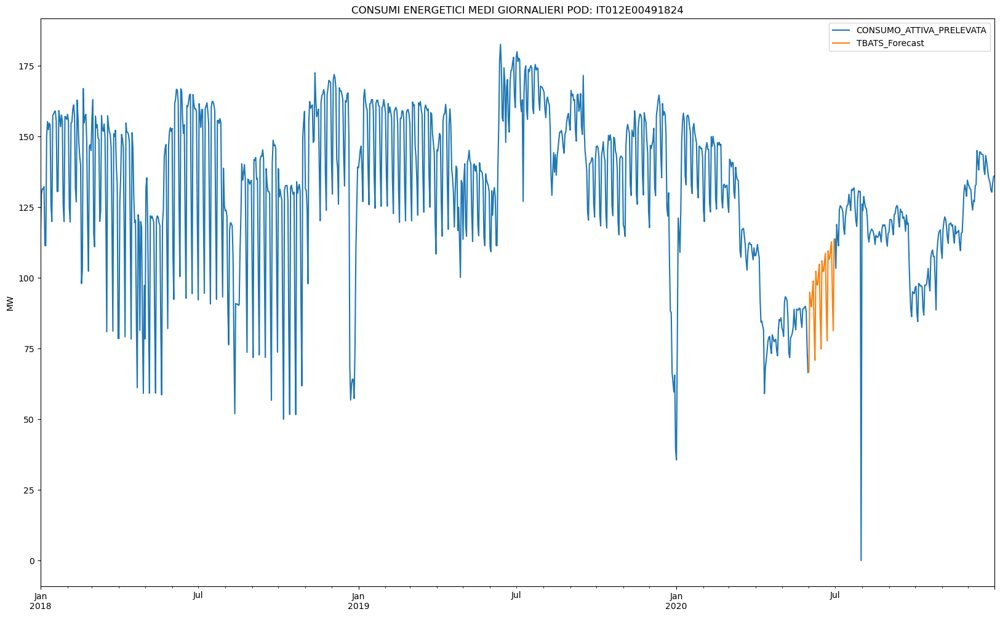

In [68]:
# Plot the forecasted values alongside the original data
title='CONSUMI ENERGETICI MEDI GIORNALIERI POD: IT012E00491824'
ylabel='MW'
xlabel='' 
ax = df_complete.resample('d').mean().plot(legend=True,figsize=(20,12),title=title)
df_for['TBATS_Forecast'].plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);

### Serie storica oraria completa

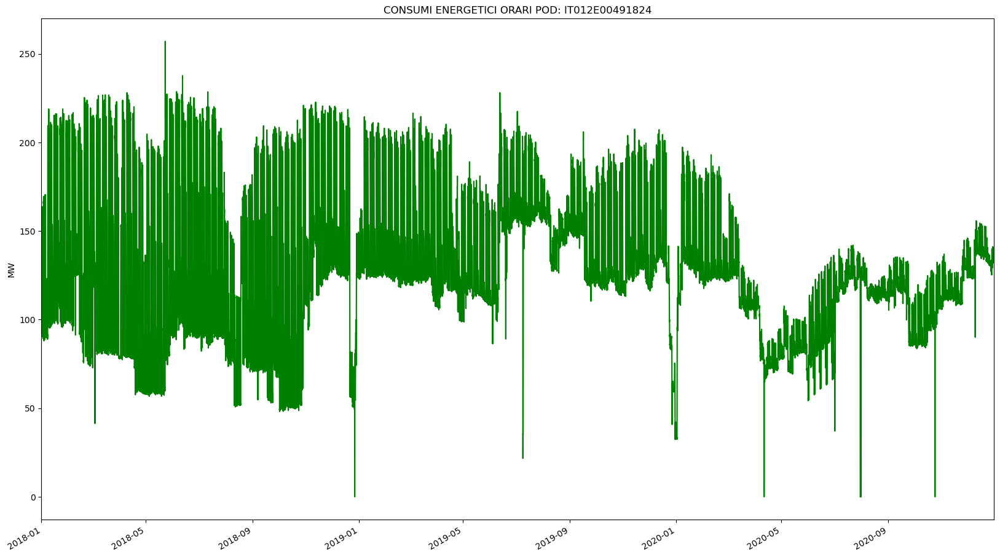

In [69]:
# Plot the forecasted values alongside the original data
title='CONSUMI ENERGETICI ORARI POD: IT012E00491824'
ylabel='MW'
xlabel='' 
ax = df_complete_POD2.plot(legend=False,figsize=(20,12),title=title, color='green')
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);

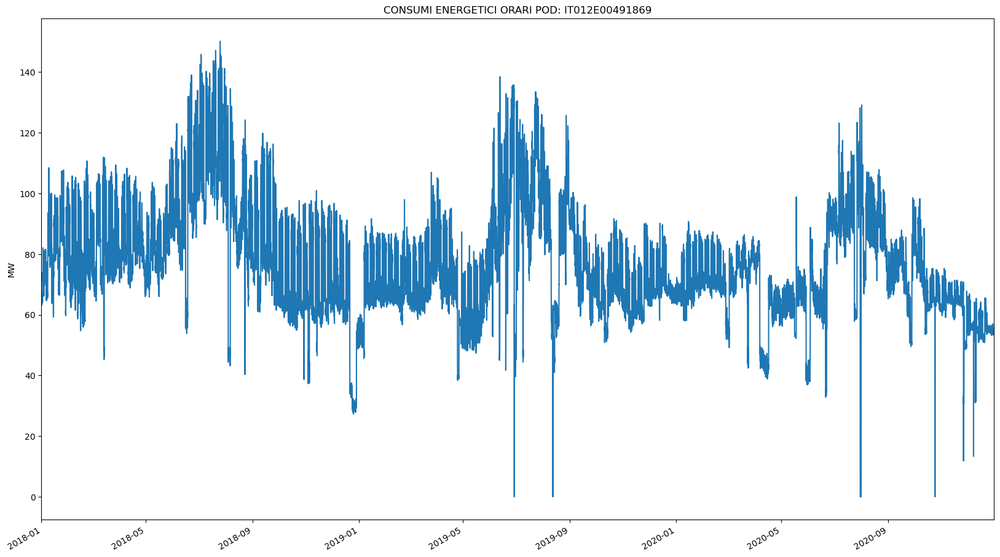

In [296]:
# Plot the forecasted values alongside the original data
title='CONSUMI ENERGETICI ORARI POD: IT012E00491869'
ylabel='MW'
xlabel='' 
ax = df_complete_POD1.plot(legend=False,figsize=(20,12),title=title)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);

In [297]:
df = df_complete_POD1.copy()
df.columns =['Y']
df = df.reset_index()
df["Date"] = df['DATE_TIME'].dt.date
df["Day"] = df['DATE_TIME'].dt.day_name()
df["Week"] = df['DATE_TIME'].dt.weekofyear
df["Month"] = df['DATE_TIME'].dt.month
df["Month_name"] = df['DATE_TIME'].dt.month_name()
df["Quarter"] = df['DATE_TIME'].dt.quarter
df["Year"] = df['DATE_TIME'].dt.year
df["Hour"] = df['DATE_TIME'].dt.hour
df.set_index('Date', inplace=True)
list_hour = list(range(0,24))
list_df_2 = [pd.DataFrame() for x in range(24)]
for i in list_hour:
    list_df_2[i] = df[df['Hour'] == i][['Y']]
    diff = pd.date_range(start = '2018-01-01', end = '2020-12-31' ).difference(list_df_2[i].index)
    if len(diff) :
        print('ora: '+ str(i))
        print(diff)

ora: 2
DatetimeIndex(['2018-03-25', '2019-03-31', '2020-03-29'], dtype='datetime64[ns]', freq=None)


In [301]:
df_complete_POD1 = df_complete_POD1.resample('H').mean().interpolate('linear')

In [450]:
df = df_complete_POD1.copy()
df.columns =['Y']
df = df.reset_index()
df["Date"] = df['DATE_TIME'].dt.date
df["Day"] = df['DATE_TIME'].dt.day_name()
df["Week"] = df['DATE_TIME'].dt.weekofyear
df["Month"] = df['DATE_TIME'].dt.month
df["Month_name"] = df['DATE_TIME'].dt.month_name()
df["Quarter"] = df['DATE_TIME'].dt.quarter
df["Year"] = df['DATE_TIME'].dt.year
df["Hour"] = df['DATE_TIME'].dt.hour
df.set_index('Date', inplace=True)
list_hour = list(range(0,24))
list_df_1 = [pd.DataFrame() for x in range(24)]
for i in list_hour:
    list_df_1[i] = df[df['Hour'] == i][['Y']]
    diff = pd.date_range(start = '2018-01-01', end = '2020-12-31' ).difference(list_df_2[i].index)
    if len(diff) :
        print('ora: '+ str(i))
        print(diff)

In [451]:
mySeries1 = []
namesofMySeries1 = []
for i in list_hour:
    list_df_1[i] = df[df['Hour'] == i][['Y']]
    mySeries1.append(list_df_2[i])
    namesofMySeries1.append(list_hour[i])

In [452]:
series_lengths = {len(series) for series in mySeries1}
print(series_lengths)

{1096}


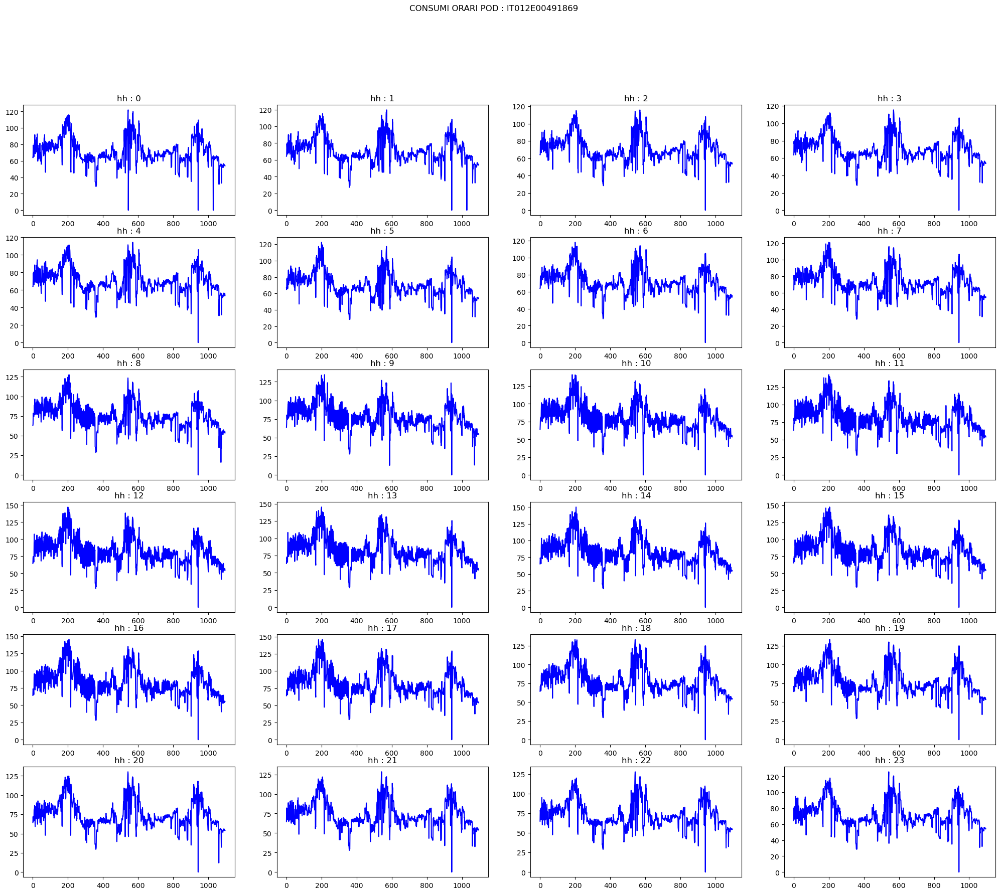

In [304]:
fig, axs = plt.subplots(6,4,figsize=(25,20))
fig.suptitle(f'CONSUMI ORARI POD : {POD_1}')
for i in range(6):
    for j in range(4):
        if i*4+j+1>len(mySeries): # pass the others that we can't fill
            continue
        axs[i, j].plot(mySeries1[i*4+j].values, color = 'blue')
        axs[i, j].set_title('hh : ' + str(namesofMySeries1[i*4+j]))
plt.show()

In [305]:
df = df_complete_POD2.copy()
df.columns =['Y']
df = df.reset_index()
df["Date"] = df['DATE_TIME'].dt.date
df["Day"] = df['DATE_TIME'].dt.day_name()
df["Week"] = df['DATE_TIME'].dt.weekofyear
df["Month"] = df['DATE_TIME'].dt.month
df["Month_name"] = df['DATE_TIME'].dt.month_name()
df["Quarter"] = df['DATE_TIME'].dt.quarter
df["Year"] = df['DATE_TIME'].dt.year
df["Hour"] = df['DATE_TIME'].dt.hour
df.set_index('Date', inplace=True)
list_hour = list(range(0,24))
list_df_2 = [pd.DataFrame() for x in range(24)]
for i in list_hour:
    list_df_2[i] = df[df['Hour'] == i][['Y']]
    diff = pd.date_range(start = '2018-01-01', end = '2020-12-31' ).difference(list_df_2[i].index)
    if len(diff) :
        print('ora: '+ str(i))
        print(diff)
    

In [245]:
df_complete_POD2 = df_complete_POD2.resample('H').mean().interpolate('linear')

In [306]:
df = df_complete_POD2.copy()
df.columns =['Y']
df = df.reset_index()
df["Date"] = df['DATE_TIME'].dt.date
df["Day"] = df['DATE_TIME'].dt.day_name()
df["Week"] = df['DATE_TIME'].dt.weekofyear
df["Month"] = df['DATE_TIME'].dt.month
df["Month_name"] = df['DATE_TIME'].dt.month_name()
df["Quarter"] = df['DATE_TIME'].dt.quarter
df["Year"] = df['DATE_TIME'].dt.year
df["Hour"] = df['DATE_TIME'].dt.hour
df.set_index('Date', inplace=True)
list_hour = list(range(0,24))
list_df_2 = [pd.DataFrame() for x in range(24)]
for i in list_hour:
    list_df_2[i] = df[df['Hour'] == i][['Y']]
    diff = pd.date_range(start = '2018-01-01', end = '2020-12-31' ).difference(list_df_2[i].index)
    if len(diff) :
        print('ora: '+ str(i))
        print(diff)

In [307]:
mySeries = []
namesofMySeries = []
for i in list_hour:
    list_df_2[i] = df[df['Hour'] == i][['Y']]
    mySeries.append(list_df_2[i])
    namesofMySeries.append(list_hour[i])

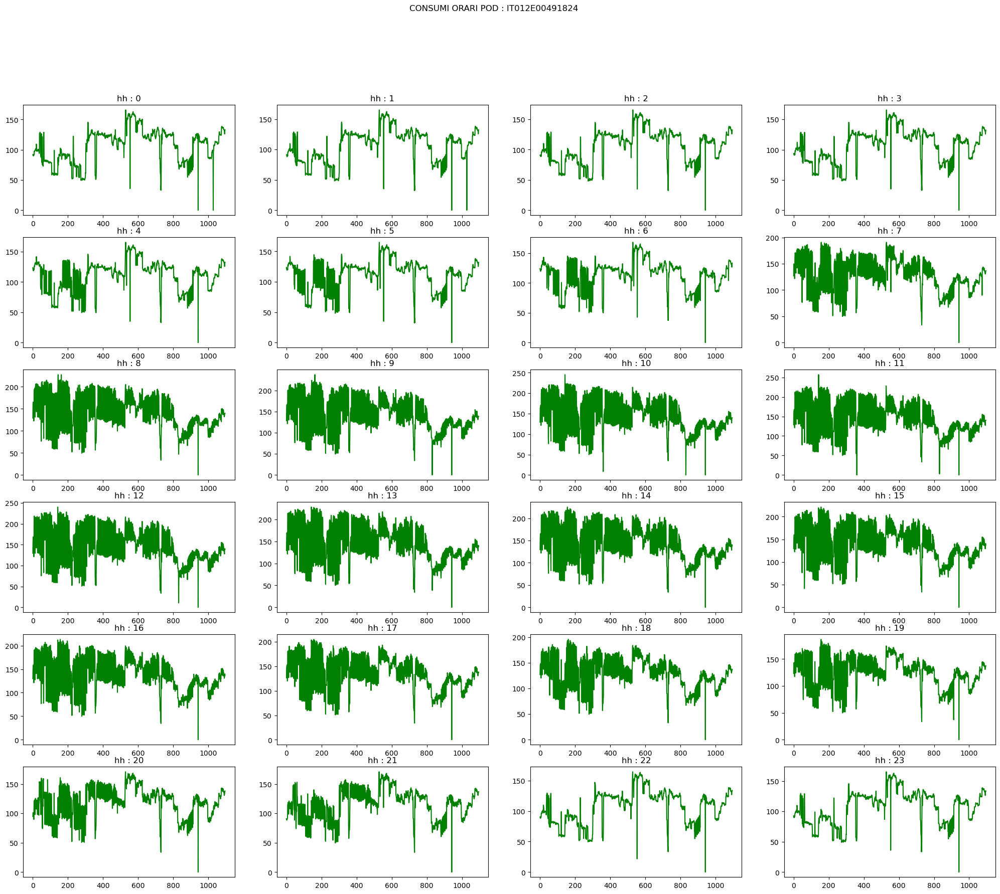

In [308]:
fig, axs = plt.subplots(6,4,figsize=(25,20))
fig.suptitle(f'CONSUMI ORARI POD : {POD_2}')
for i in range(6):
    for j in range(4):
        if i*4+j+1>len(mySeries): # pass the others that we can't fill
            continue
        axs[i, j].plot(mySeries[i*4+j].values, color = 'green')
        axs[i, j].set_title('hh : ' + str(namesofMySeries[i*4+j]))
plt.show()

In [309]:
series_lengths = {len(series) for series in mySeries}
print(series_lengths)

{1096}


# Clustering

## K-Mean clustering

In [312]:
cluster_count = 3 #math.ceil(math.sqrt(len(mySeries))) 
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN
km = TimeSeriesKMeans(n_clusters=cluster_count, metric="dtw") #euclidean
labels = km.fit_predict(mySeries)

In [364]:
cluster_hour = zip(list(range(24)), list(labels))
cluster_hour = list(cluster_hour)
cluster_hour

[(0, 0),
 (1, 0),
 (2, 0),
 (3, 0),
 (4, 0),
 (5, 0),
 (6, 0),
 (7, 2),
 (8, 1),
 (9, 1),
 (10, 1),
 (11, 1),
 (12, 1),
 (13, 1),
 (14, 1),
 (15, 1),
 (16, 1),
 (17, 2),
 (18, 2),
 (19, 2),
 (20, 0),
 (21, 0),
 (22, 0),
 (23, 0)]

In [448]:
mySeries = []
namesofMySeries = []
for i in list_hour:
    list_df_2[i] = df[df['Hour'] == i][['Y']]
    mySeries.append(list_df_2[i]['Y'])
    namesofMySeries.append(list_hour[i])

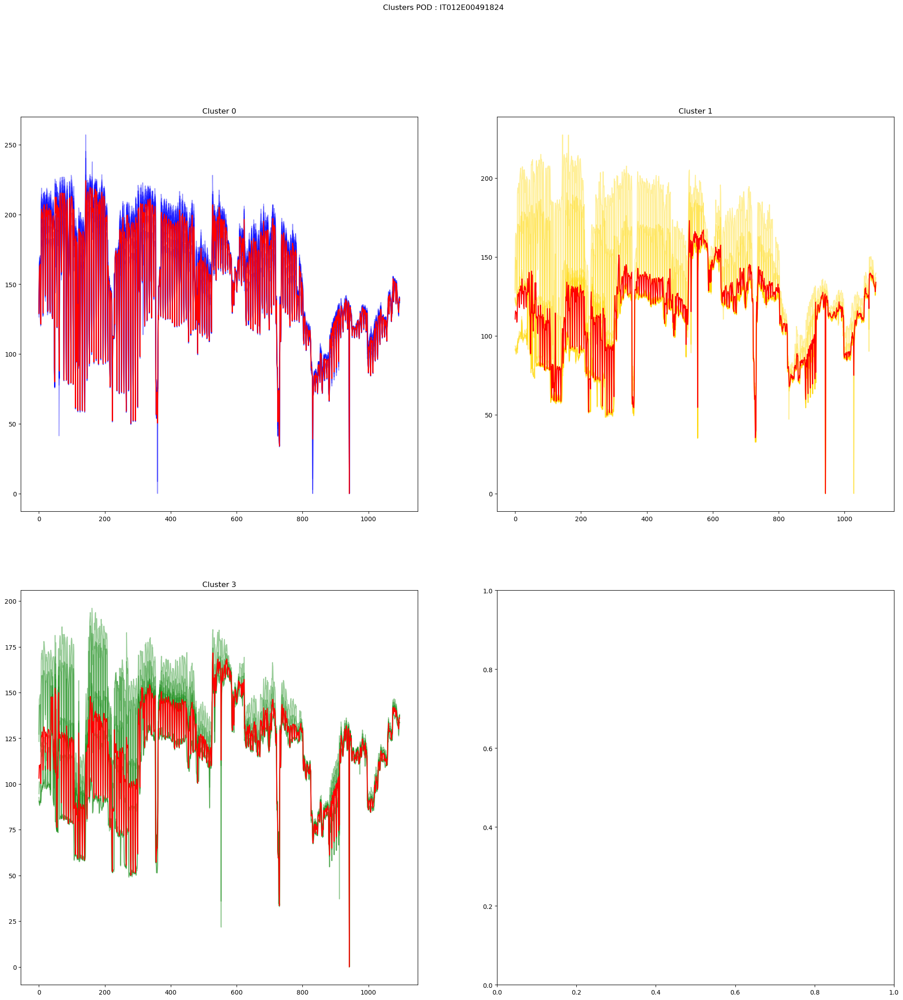

In [449]:
plot_count = math.ceil(math.sqrt(cluster_count))
cluster =[]
fig, axs = plt.subplots(plot_count, plot_count, figsize=(25,25))
fig.suptitle(f'Clusters POD : {POD_2}')
row_i=0
column_j=0
colors = ['blue', 'gold', 'green']
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(mySeries[i].values, c=colors[labels[i]], alpha=0.4)
                cluster.append(mySeries[i])
                axs[row_i, column_j].set_title("Cluster "+str(labels[i]))
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

In [387]:
cluster_count = 3 #math.ceil(math.sqrt(len(mySeries))) 
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN
km = TimeSeriesKMeans(n_clusters = cluster_count, metric="euclidean") #euclidean
labels = km.fit_predict(mySeries1)

In [390]:
cluster_count = 3 #math.ceil(math.sqrt(len(mySeries))) 
# A good rule of thumb is choosing k as the square root of the number of points in the training data set in kNN
km = TimeSeriesKMeans(n_clusters = cluster_count, metric="dtw") #euclidean
labels_dtw = km.fit_predict(mySeries1)

In [391]:
cluster_hour = zip(list(range(24)), list(labels), list(labels_dtw))
cluster_hour = list(cluster_hour)
cluster_hour

[(0, 1, 0),
 (1, 1, 0),
 (2, 1, 0),
 (3, 1, 0),
 (4, 1, 0),
 (5, 1, 0),
 (6, 1, 0),
 (7, 1, 0),
 (8, 1, 0),
 (9, 0, 1),
 (10, 0, 1),
 (11, 0, 1),
 (12, 0, 2),
 (13, 0, 2),
 (14, 0, 2),
 (15, 0, 2),
 (16, 0, 2),
 (17, 0, 2),
 (18, 2, 0),
 (19, 2, 0),
 (20, 2, 0),
 (21, 2, 0),
 (22, 2, 0),
 (23, 2, 0)]

In [453]:
mySeries1 = []
namesofMySeries1 = []
for i in list_hour:
    list_df_1[i] = df[df['Hour'] == i][['Y']]
    mySeries1.append(list_df_1[i]['Y'])
    namesofMySeries1.append(list_hour[i])

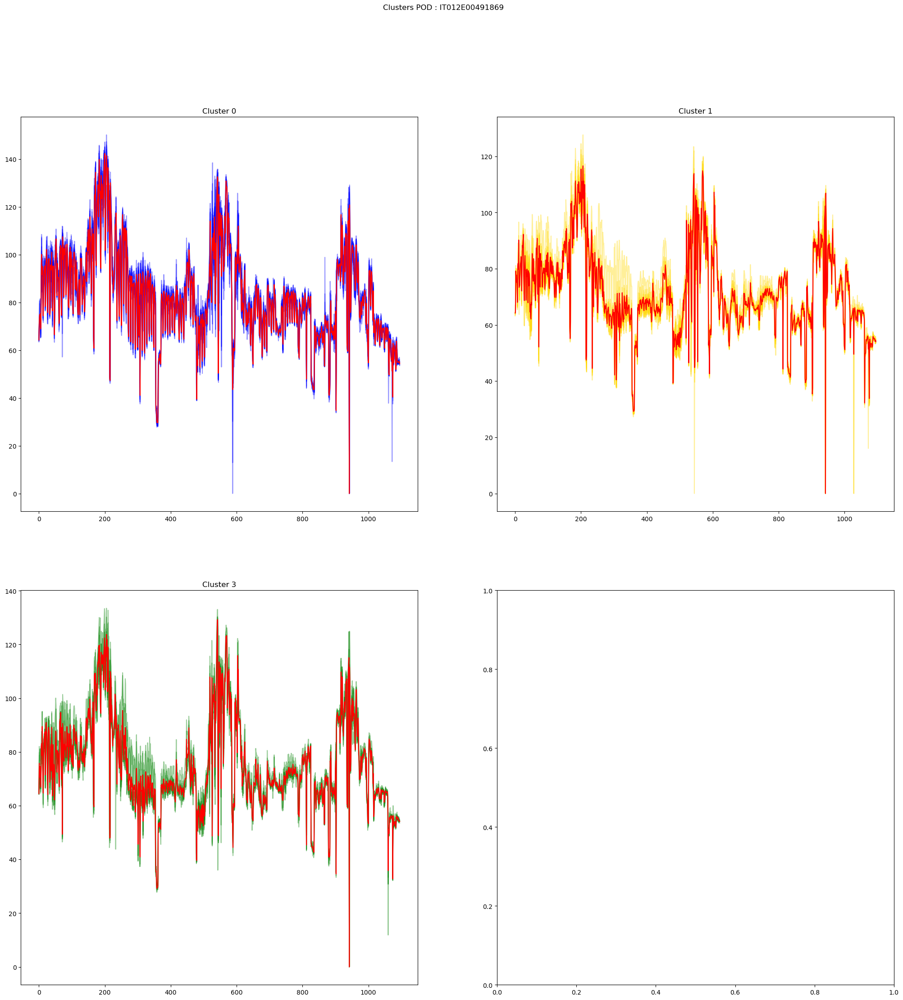

In [455]:
plot_count = math.ceil(math.sqrt(cluster_count))
cluster =[]
fig, axs = plt.subplots(plot_count, plot_count, figsize=(25,25))
fig.suptitle(f'Clusters POD : {POD_1}')
row_i=0
column_j=0
colors = ['blue', 'gold', 'green']
for label in set(labels):
    cluster = []
    for i in range(len(labels)):
            if(labels[i]==label):
                axs[row_i, column_j].plot(mySeries1[i].values, c=colors[labels[i]], alpha=0.4)
                cluster.append(mySeries1[i])
                axs[row_i, column_j].set_title("Cluster "+str(labels[i]))
    if len(cluster) > 0:
        axs[row_i, column_j].plot(np.average(np.vstack(cluster),axis=0),c="red")
    axs[row_i, column_j].set_title("Cluster "+str(row_i*som_y+column_j))
    column_j+=1
    if column_j%plot_count == 0:
        row_i+=1
        column_j=0
        
plt.show()

## SOM

In [432]:
mySeries = []
namesofMySeries = []
for i in list_hour:
    list_df_2[i] = df[df['Hour'] == i][['Y']]
    mySeries.append(list_df_2[i]['Y'])
    namesofMySeries.append(list_hour[i])

In [438]:

len(mySeries)


24

In [439]:
som_x = som_y = math.ceil(math.sqrt(math.sqrt(len(mySeries))))
# I didn't see its significance but to make the map square,
# I calculated square root of map size which is 
# the square root of the number of series
# for the row and column counts of som

som = MiniSom(som_x, som_y, len(mySeries[0]), sigma=0.3, learning_rate = 0.1)

som.random_weights_init(mySeries)
som.train(mySeries, 1096)

ValueError: Length of passed values is 3, index implies 1096.

## FbProphet
https://facebook.github.io/prophet/docs/quick_start.html

In [196]:
frame_MONTH = frame.groupby(['POD', 'YEAR', 'MONTH', 'DAY'], as_index=False).mean()
df = frame_MONTH[frame_MONTH['POD'] == 'IT012E00491824']
df['DATE_TIME'] = pd.to_datetime({'year':df['YEAR'], 'month':df['MONTH'], 'day':df['DAY']})
#df = df.set_index('DATE_TIME')
df = df[['DATE_TIME', 'CONSUMO_ATTIVA_PRELEVATA']]
#df.sort_index(ascending=True, inplace=True)
df.columns = ['ds','y']
df_train = df[df['ds']<'2020-06-01']

In [213]:
frame_MONTH = frame.groupby(['POD', 'YEAR', 'MONTH', 'DAY', 'HOUR'], as_index=False).mean()
df = frame_MONTH[frame_MONTH['POD'] == 'IT012E00491824']
df['DATE_TIME'] = pd.to_datetime({'year':df['YEAR'], 'month':df['MONTH'], 'day':df['DAY'], 'hour':df['HOUR']})
#df = df.set_index('DATE_TIME')
df = df[['DATE_TIME', 'CONSUMO_ATTIVA_PRELEVATA']]
#df.sort_index(ascending=True, inplace=True)
df.columns = ['ds','y']
df_train = df[df['ds']<'2020-06-01']

In [214]:
m = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
m.add_country_holidays(country_name='IT')
m.fit(df_train)
future = m.make_future_dataframe(periods=214, freq='D')
forecast = m.predict(future)

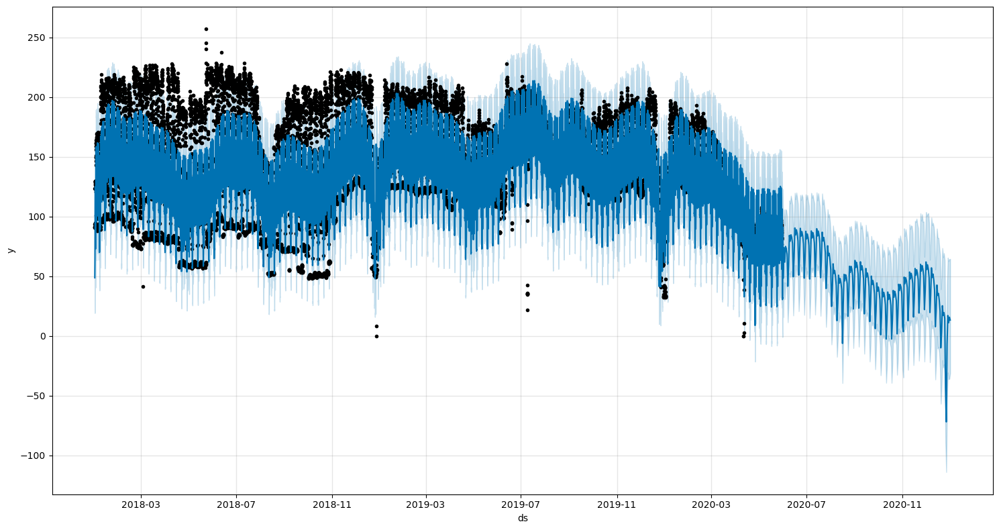

In [218]:
fig1 = m.plot(forecast, figsize=(15,8))

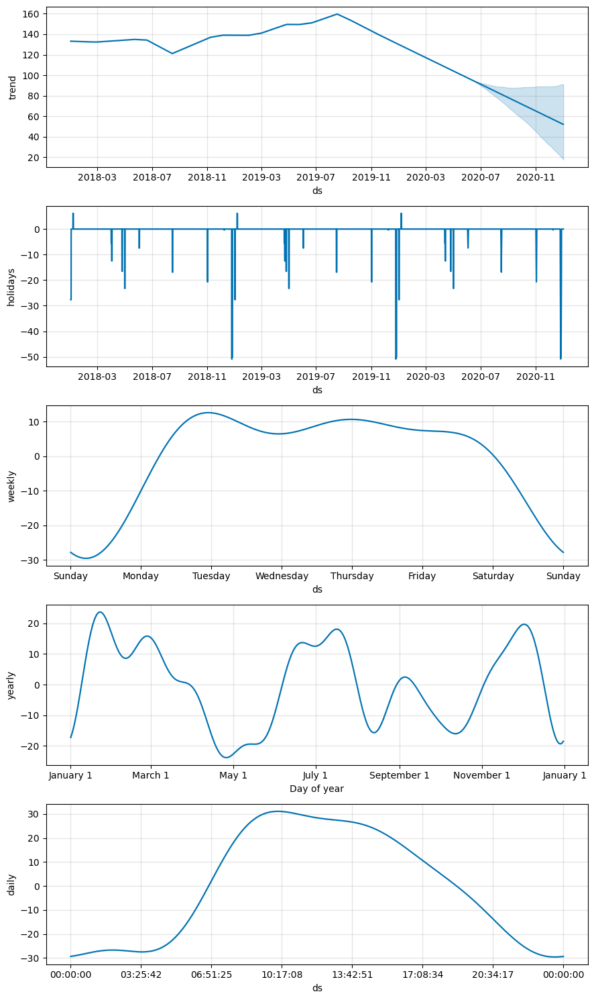

In [219]:
fig2 = m.plot_components(forecast)

In [221]:
forecast = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

In [222]:
forecast['ds'] = pd.to_datetime(forecast['ds'], format='%Y-%m-%d')
forecast = forecast.set_index('ds')

In [223]:
df_train = df.set_index('ds')
forecast = forecast.loc['2020-06-01':]
forecast.rename(columns = {'yhat' : 'fbProphet Forecast', 'yhat_lower' : 'fbProphet Forecast Lower bound',  'yhat_upper' : 'fbProphet Forecast Upper bound'}, inplace = True)
forecast

,fbProphet Forecast,fbProphet Forecast Lower bound,fbProphet Forecast Upper bound
ds,,,
2020-06-01 23:00:00,73.983461,45.008755,105.804972
2020-06-02 23:00:00,61.861616,30.725083,92.689210
2020-06-03 23:00:00,74.998780,44.683973,106.008479
2020-06-04 23:00:00,73.335224,42.504885,105.437503
2020-06-05 23:00:00,68.600157,39.368175,100.341267
...,...,...,...
2020-12-27 23:00:00,-6.839042,-52.399154,42.582012
2020-12-28 23:00:00,17.146246,-30.614753,65.547287
2020-12-29 23:00:00,11.112126,-36.242621,62.697020


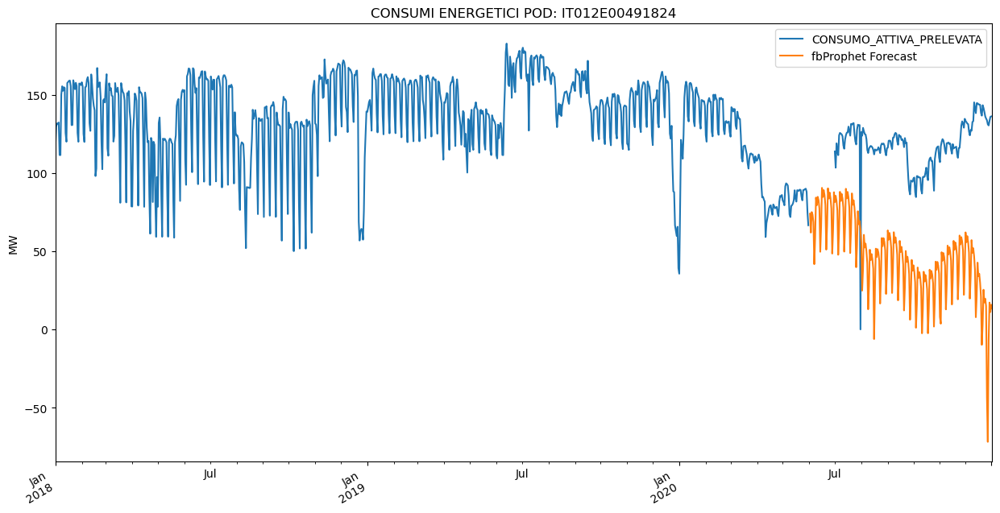

In [224]:
# Plot the forecasted values alongside the original data
title='CONSUMI ENERGETICI POD: IT012E00491824'
ylabel='MW'
xlabel='' 
df_train.columns = ['CONSUMO_ATTIVA_PRELEVATA']
ax = df_train.resample('d').mean().plot(legend=True,figsize=(15,8),title=title)
forecast['fbProphet Forecast'].plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);

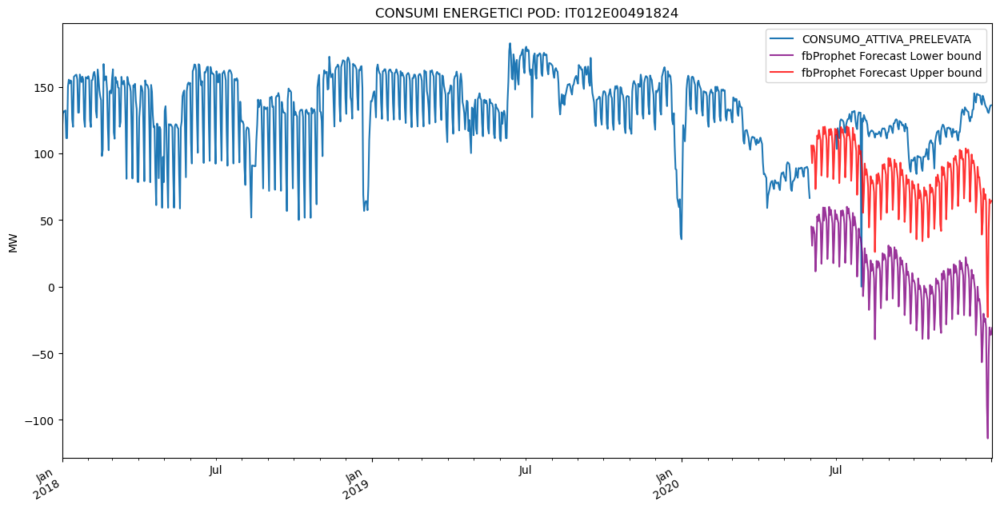

In [225]:
# Plot the forecasted values alongside the original data
title='CONSUMI ENERGETICI POD: IT012E00491824'
ylabel='MW'
xlabel='' 
df_train.columns = ['CONSUMO_ATTIVA_PRELEVATA']
ax = df_train.resample('d').mean().plot(legend=True,figsize=(15,8),title=title)
forecast['fbProphet Forecast Lower bound'].plot(legend=True, color='purple', alpha=0.8)
forecast['fbProphet Forecast Upper bound'].plot(legend=True, color='red', alpha=0.8)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);


## SARIMAX
Variabili esogene
forecast su test

In [235]:
frame_HOUR = frame.groupby(['POD', 'YEAR', 'MONTH', 'DAY', 'HOUR'], as_index=False).mean()
df = frame_HOUR[frame_HOUR['POD'] == 'IT012E00491869']
df['DATE_TIME'] = pd.to_datetime({'year':df['YEAR'], 'month':df['MONTH'], 'day':df['DAY'], 'hour':df['HOUR']})
df = df.set_index('DATE_TIME')
df = df[['CONSUMO_ATTIVA_PRELEVATA']]
df.sort_index(ascending=True, inplace=True)
df.columns = ['Y']
df_orig = df.copy()

In [236]:
hour_fcast = 19

In [237]:
df = df_orig[df_orig.index.hour == hour_fcast]
df.index = df.index.date

In [238]:
df = pd.merge(df, df_cal_holiday[['dummy_holiday', 'dummy_Covid']], left_index=True, right_index=True)
df

,Y,dummy_holiday,dummy_Covid
Date,,,
2018-01-01,64.20,1,0
2018-01-02,71.10,0,0
2018-01-03,67.95,0,0
2018-01-04,70.80,0,0
2018-01-05,71.85,0,0
...,...,...,...
2020-12-27,54.45,0,1
2020-12-28,53.85,0,1
2020-12-29,55.80,0,1


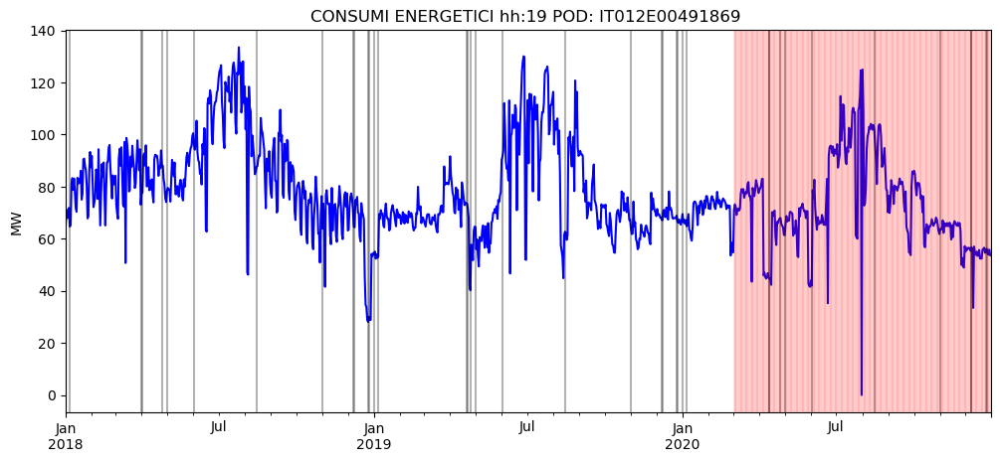

In [239]:
# Plot the source data
title=f'CONSUMI ENERGETICI hh:{hour_fcast} POD: IT012E00491869 '
ylabel='MW'
xlabel='' 
ax = df['Y'].plot(figsize=(12,5),title=title, color = 'blue', legend=False)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);
for x in df_1.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3)
for x in df_1.query('dummy_Covid==1').index: 
    ax.axvline(x=x, color='r', alpha = 0.1);

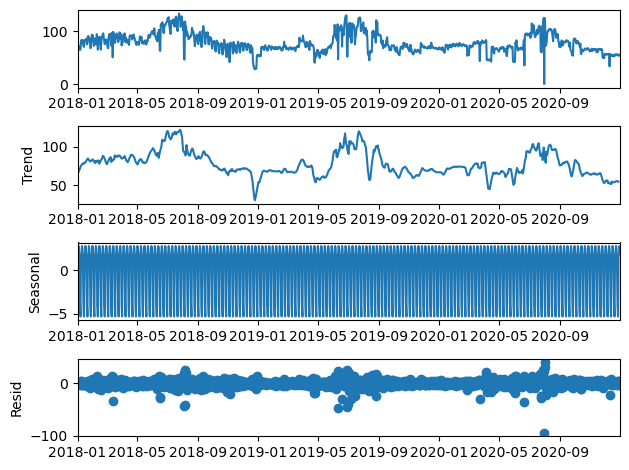

In [240]:
df.index.freq = 'd'
result = seasonal_decompose(df[['Y']], model='add')
result.plot();

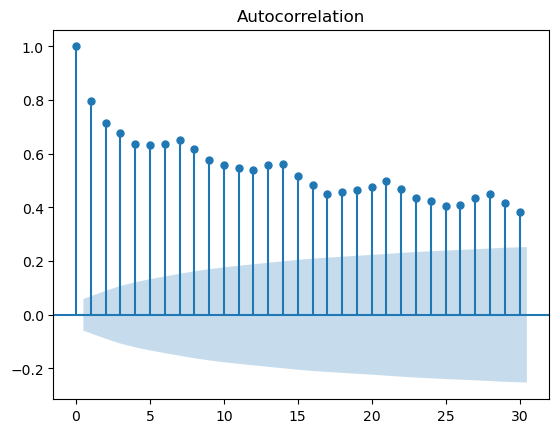

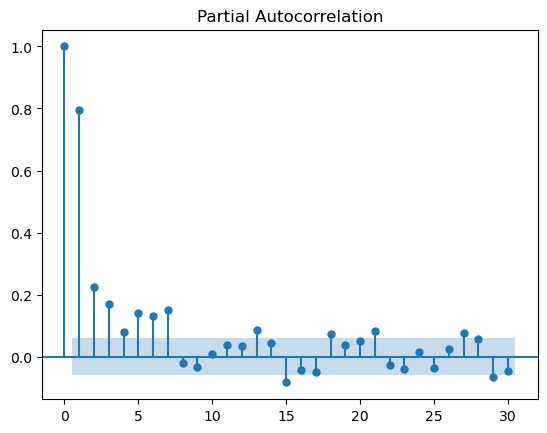

In [241]:
# Draw ACF and PACF Plot Charts
plot_acf(df[['Y']].values.squeeze(), lags=30)
plot_pacf(df[['Y']].values.squeeze(), lags=30)
plt.show()

In [247]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series,title=f'CONSUMI ENERGETICI hh:{hour_fcast} POD: IT012E00491869'):
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():
        out[f'critical value ({key})']=val
        
    print(out.to_string())          # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

In [248]:
adf_test(df['Y'])

Augmented Dickey-Fuller Test: CONSUMI ENERGETICI hh:19 POD: IT012E00491869
ADF test statistic        -2.584432
p-value                    0.096258
# lags used               20.000000
# observations          1075.000000
critical value (1%)       -3.436448
critical value (5%)       -2.864232
critical value (10%)      -2.568204
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [249]:
Msarima = pmdarima.auto_arima(df['Y'], seasonal=True, m=7)

In [250]:
Msarima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                                      y   No. Observations:                 1096
Model:             SARIMAX(3, 1, 1)x(1, 0, [1, 2], 7)   Log Likelihood               -4056.585
Date:                                Sun, 02 May 2021   AIC                           8131.170
Time:                                        11:53:58   BIC                           8176.156
Sample:                                             0   HQIC                          8148.192
                                               - 1096                                         
Covariance Type:                                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0001      0.002     -0.092      0.927      -0.003       0.003
ar.L1          0.4773      0.017     27.365      0.000       0.443       0.511
ar.L2          0.1252      0.019      6.507      0.000       0.087       0.163
ar.L3          0.1284      0.022      5.937      0.000       0.086       0.171
ma.L1         -0.9650      0.012    -83.614      0.000      -0.988      -0.942
ar.S.L7        0.9662      0.016     60.058      0.000       0.935       0.998
ma.S.L7       -0.8861      0.024    -36.413      0.000      -0.934      -0.838
ma.S.L14    4.957e-05      0.024      0.002      0.998      -0.046       0.046
sigma2        99.0621      2.167     45.724      0.000      94.816     103.308
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):             26369.63
Prob(Q):                              0.91   Prob(JB):                         0.00
Heteroskedasticity (H):               1.56   Skew:                            -1.65
Prob(H) (two-sided):                  0.00   Kurtosis:                        26.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [253]:
# Run pmdarima.auto_arima to obtain recommended orders
par = Msarima.get_params()
order = par['order']
seasonal_order = par['seasonal_order']

In [254]:
# Set four weeks for testing
train = df.iloc[:len(df)-31]
test = df.iloc[len(df)-31:]

In [255]:
model = SARIMAX(train['Y'], order = order, seasonal_order=seasonal_order, enforce_invertibility = False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                                      Y   No. Observations:                 1065
Model:             SARIMAX(3, 1, 1)x(1, 0, [1, 2], 7)   Log Likelihood               -3954.857
Date:                                Sun, 02 May 2021   AIC                           7925.713
Time:                                        11:56:21   BIC                           7965.471
Sample:                                    01-01-2018   HQIC                          7940.778
                                         - 11-30-2020                                         
Covariance Type:                                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5342      0.016     33.199      0.000       0.503       0.566
ar.L2          0.1666      0.018      9.112      0.000       0.131       0.202
ar.L3          0.1683      0.018      9.112      0.000       0.132       0.205
ma.L1         -0.9997      0.013    -77.647      0.000      -1.025      -0.975
ar.S.L7        0.9904      0.005    194.594      0.000       0.980       1.000
ma.S.L7       -0.9299      0.018    -50.411      0.000      -0.966      -0.894
ma.S.L14      -0.0078      0.019     -0.408      0.683      -0.045       0.030
sigma2        98.8180      2.410     41.006      0.000      94.095     103.541
===================================================================================
Ljung-Box (L1) (Q):                   0.27   Jarque-Bera (JB):             25823.59
Prob(Q):                              0.60   Prob(JB):                         0.00
Heteroskedasticity (H):               1.67   Skew:                            -1.38
Prob(H) (two-sided):                  0.00   Kurtosis:                        26.98
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [258]:
fcast = results.predict(start=len(df)-31, end=len(df)-1, typ='levels').rename(f'SARIMA{order}{seasonal_order} Forecast')

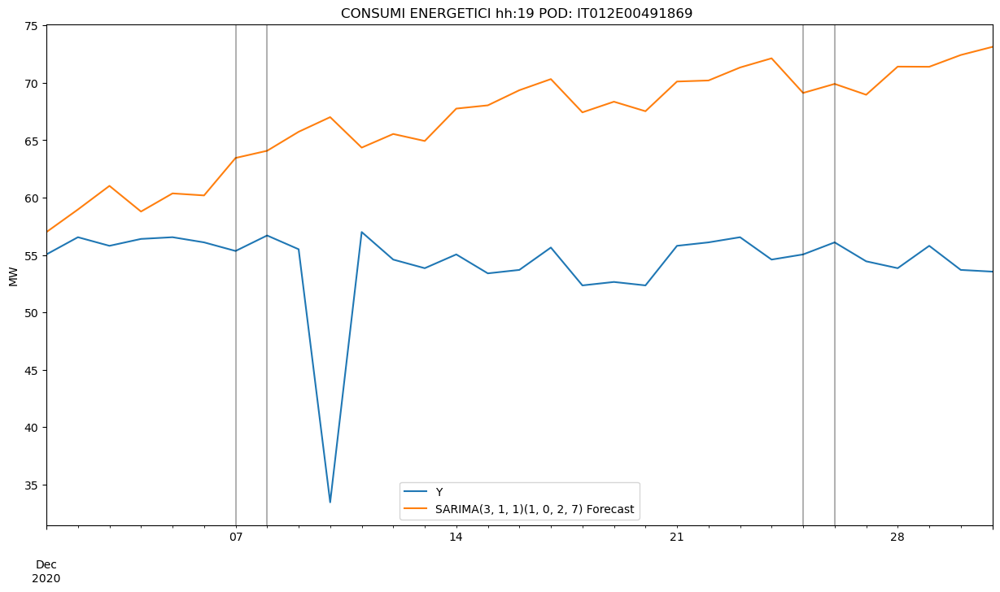

In [259]:
# Plot predictions against known values
title=f'CONSUMI ENERGETICI hh:{hour_fcast} POD: IT012E00491869 '
ylabel='MW'
xlabel=''
ax = test['Y'].plot(legend=True,figsize=(15,8),title=title)
fcast.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
for x in test.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3);

In [260]:
error1 = mse(test['Y'], fcast)
error2 = rmse(test['Y'], fcast)

print(f'SARIMA(1,0,0)(2,0,0,7) MSE Error: {error1:11.10}')
print(f'SARIMA(1,0,0)(2,0,0,7) RMSE Error: {error2:11.10}')

SARIMA(1,0,0)(2,0,0,7) MSE Error: 196.1043559
SARIMA(1,0,0)(2,0,0,7) RMSE Error:  14.0037265


### Exog variable

In [261]:
model = SARIMAX(train['Y'], exog=train['dummy_holiday'], order=order, seasonal_order=seasonal_order, enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                                      Y   No. Observations:                 1065
Model:             SARIMAX(3, 1, 1)x(1, 0, [1, 2], 7)   Log Likelihood               -3945.107
Date:                                Sun, 02 May 2021   AIC                           7908.215
Time:                                        11:56:56   BIC                           7952.943
Sample:                                    01-01-2018   HQIC                          7925.163
                                         - 11-30-2020                                         
Covariance Type:                                  opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
dummy_holiday    -2.3770      2.338     -1.017      0.309      -6.959       2.205
ar.L1             0.4012      0.027     14.614      0.000       0.347       0.455
ar.L2             0.0825      0.023      3.597      0.000       0.038       0.127
ar.L3             0.0747      0.024      3.104      0.002       0.028       0.122
ma.L1            -0.8973      0.025    -35.204      0.000      -0.947      -0.847
ar.S.L7           0.9941      0.003    324.921      0.000       0.988       1.000
ma.S.L7          -0.9402      0.021    -45.055      0.000      -0.981      -0.899
ma.S.L14         -0.0164      0.021     -0.789      0.430      -0.057       0.024
sigma2           96.6895      1.808     53.465      0.000      93.145     100.234
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             26320.37
Prob(Q):                              0.98   Prob(JB):                         0.00
Heteroskedasticity (H):               1.69   Skew:                            -1.84
Prob(H) (two-sided):                  0.00   Kurtosis:                        27.09
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [262]:
# Obtain predicted values
start=len(train)
end=len(train)+len(test)-1
exog_forecast = test[['dummy_holiday']] 
predictions = results.predict(start=start, end=end, exog=exog_forecast).rename('SARIMAX Predictions')

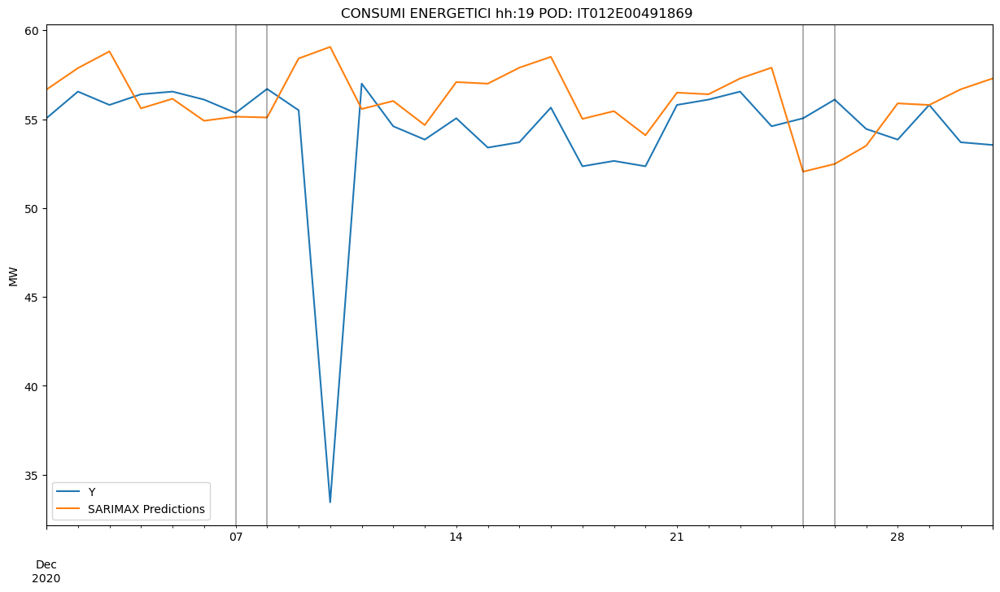

In [263]:
# Plot predictions against known values
title=f'CONSUMI ENERGETICI hh:{hour_fcast} POD: IT012E00491869 '
ylabel='MW'
xlabel=''
ax = test['Y'].plot(legend=True,figsize=(15,8),title=title)
predictions.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
for x in test.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3);

In [264]:
# Print values from SARIMA above
print(f'SARIMA MSE Error: {error1:11.10}')
print(f'SARIMA RMSE Error: {error2:11.10}')
print()

error1x = mse(test['Y'], fcast)
error2x = rmse(test['Y'], predictions)

# Print new SARIMAX values
print(f'SARIMAX MSE Error: {error1x:11.10}')
print(f'SARIMAX RMSE Error: {error2x:11.10}')

SARIMA MSE Error: 196.1043559
SARIMA RMSE Error:  14.0037265

SARIMAX MSE Error: 196.1043559
SARIMAX RMSE Error: 5.112762147


## SARIMAX
Forecast su futuro

In [285]:
print(f'Analisi sull\' ora {hour_fcast}')

Analisi sull' ora 19


In [276]:
df = df_orig[df_orig.index.hour == hour_fcast]
df.index = df.index.date

In [277]:
df = pd.merge(df, df_cal_holiday[['dummy_holiday', 'dummy_Covid']], left_index=True, right_index=True, how='outer')
df = df.loc[:'2020-12-31']

In [278]:
model = SARIMAX(df['Y'], exog=df['dummy_holiday'], order=order, seasonal_order=seasonal_order, enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                                      Y   No. Observations:                 1096
Model:             SARIMAX(3, 1, 1)x(1, 0, [1, 2], 7)   Log Likelihood               -4058.915
Date:                                Sun, 02 May 2021   AIC                           8135.830
Time:                                        11:59:12   BIC                           8180.817
Sample:                                    01-01-2018   HQIC                          8152.853
                                         - 12-31-2020                                         
Covariance Type:                                  opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
dummy_holiday    -2.0896      2.418     -0.864      0.388      -6.830       2.650
ar.L1             0.5258      0.015     33.980      0.000       0.495       0.556
ar.L2             0.1610      0.018      8.998      0.000       0.126       0.196
ar.L3             0.1749      0.018      9.557      0.000       0.139       0.211
ma.L1            -1.0000      0.189     -5.281      0.000      -1.371      -0.629
ar.S.L7           0.9877      0.006    155.882      0.000       0.975       1.000
ma.S.L7          -0.9198      0.018    -49.913      0.000      -0.956      -0.884
ma.S.L14         -0.0073      0.019     -0.378      0.705      -0.045       0.031
sigma2           96.2741     17.842      5.396      0.000      61.305     131.244
===================================================================================
Ljung-Box (L1) (Q):                   0.13   Jarque-Bera (JB):             26309.54
Prob(Q):                              0.72   Prob(JB):                         0.00
Heteroskedasticity (H):               1.59   Skew:                            -1.38
Prob(H) (two-sided):                  0.00   Kurtosis:                        26.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [279]:
# Obtain predicted values
start=len(df)
end=len(df)+len(df)-1
exog_forecast = df[['dummy_holiday']] 
predictions = results.predict(start=start, end=end, exog=exog_forecast).rename('SARIMAX Predictions')

In [283]:
predictions = predictions[:30]
df = df[['Y', 'dummy_holiday']]
df.columns = ['CONSUMI ENERGETICI', 'dummy_holiday']

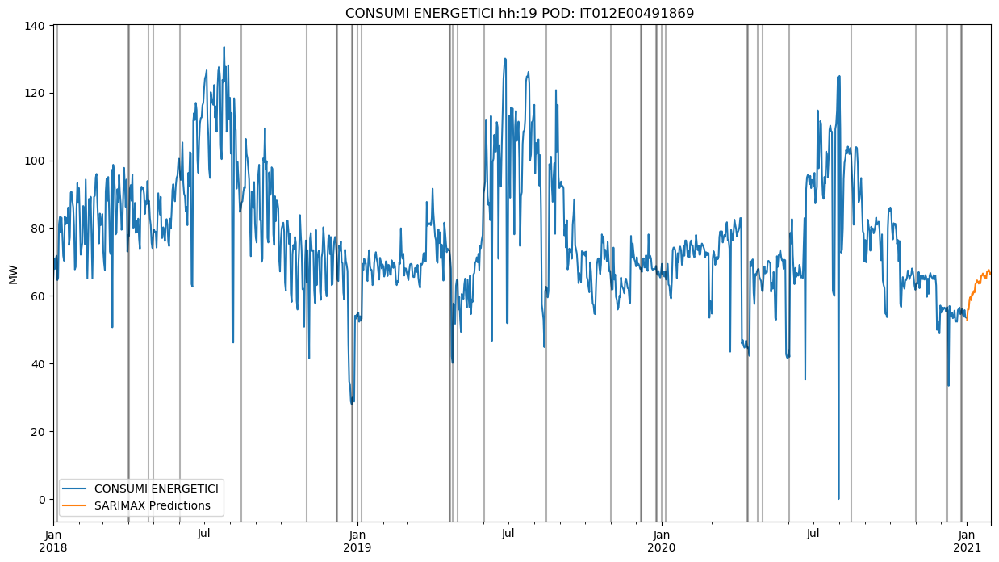

In [284]:
# Plot predictions against known values
title=f'CONSUMI ENERGETICI hh:{hour_fcast} POD: IT012E00491869 '
ylabel='MW'
xlabel=''
ax = df['CONSUMI ENERGETICI'].plot(legend=True,figsize=(15,8),title=title)
predictions.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
for x in df.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3);

## Analisi per POD: IT012E00491824

In [286]:
print(f'Analisi sull\' ora {hour_fcast}')

Analisi sull' ora 19


In [287]:
df = df_complete_POD2[df_complete_POD2.index.hour == hour_fcast]
df.index = df.index.date

In [288]:
df = pd.merge(df, df_cal_holiday[['dummy_holiday', 'dummy_Covid']], left_index=True, right_index=True, how='outer')
df = df.loc[:'2020-12-31']


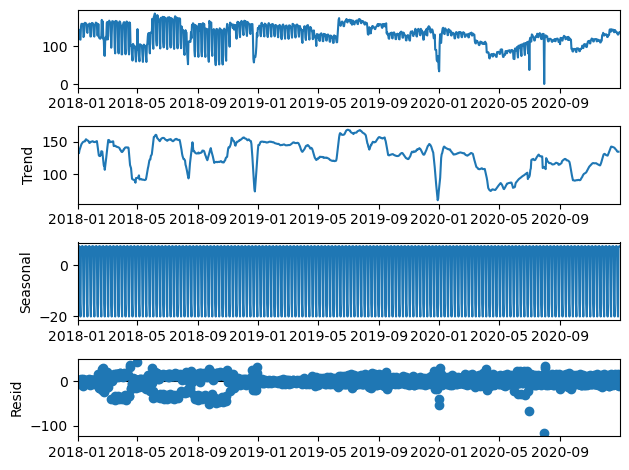

In [289]:
df.index.freq = 'd'
result = seasonal_decompose(df[['Y']], model='add')
result.plot();

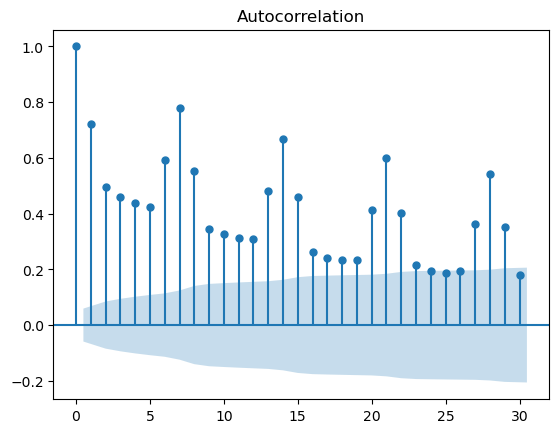

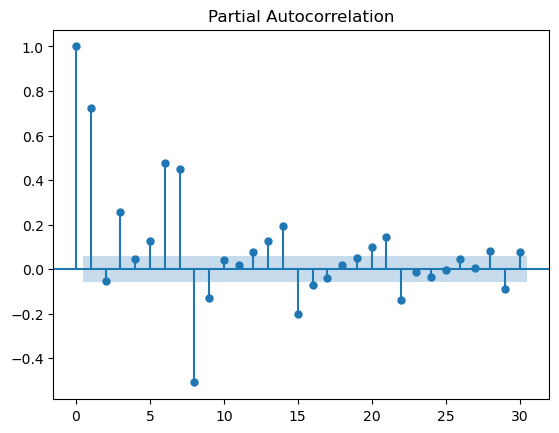

In [290]:
# Draw ACF and PACF Plot Charts
plot_acf(df[['Y']].values.squeeze(), lags=30)
plot_pacf(df[['Y']].values.squeeze(), lags=30)
plt.show()

In [291]:
Msarima = pmdarima.auto_arima(df['Y'], seasonal=True, m=7)

In [292]:
Msarima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                                      y   No. Observations:                 1096
Model:             SARIMAX(3, 1, 0)x(2, 0, [1, 2], 7)   Log Likelihood               -4276.901
Date:                                Sun, 02 May 2021   AIC                           8569.802
Time:                                        12:01:38   BIC                           8609.790
Sample:                                             0   HQIC                          8584.933
                                               - 1096                                         
Covariance Type:                                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2842      0.010    -28.664      0.000      -0.304      -0.265
ar.L2         -0.1992      0.024     -8.309      0.000      -0.246      -0.152
ar.L3         -0.0907      0.030     -3.062      0.002      -0.149      -0.033
ar.S.L7        1.5762      0.176      8.969      0.000       1.232       1.921
ar.S.L14      -0.5801      0.173     -3.349      0.001      -0.919      -0.241
ma.S.L7       -1.2764      0.185     -6.909      0.000      -1.638      -0.914
ma.S.L14       0.3502      0.144      2.436      0.015       0.068       0.632
sigma2       143.0874      1.784     80.209      0.000     139.591     146.584
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):             29078.73
Prob(Q):                              0.87   Prob(JB):                         0.00
Heteroskedasticity (H):               0.70   Skew:                            -0.13
Prob(H) (two-sided):                  0.00   Kurtosis:                        28.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [293]:
# Run pmdarima.auto_arima to obtain recommended orders
par = Msarima.get_params()
order = par['order']
seasonal_order = par['seasonal_order']

In [294]:
model = SARIMAX(df['Y'], exog=df['dummy_holiday'], order=order, seasonal_order=seasonal_order, enforce_invertibility=False)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                                      Y   No. Observations:                 1096
Model:             SARIMAX(3, 1, 0)x(2, 0, [1, 2], 7)   Log Likelihood               -4270.853
Date:                                Sun, 02 May 2021   AIC                           8559.706
Time:                                        12:01:42   BIC                           8604.692
Sample:                                    01-01-2018   HQIC                          8576.728
                                         - 12-31-2020                                         
Covariance Type:                                  opg                                         
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
dummy_holiday    -6.5388      1.443     -4.533      0.000      -9.366      -3.711
ar.L1            -0.2943      0.010    -29.500      0.000      -0.314      -0.275
ar.L2            -0.2058      0.024     -8.458      0.000      -0.254      -0.158
ar.L3            -0.0875      0.029     -3.058      0.002      -0.144      -0.031
ar.S.L7           1.6093      0.190      8.465      0.000       1.237       1.982
ar.S.L14         -0.6137      0.187     -3.287      0.001      -0.980      -0.248
ma.S.L7          -1.3065      0.198     -6.583      0.000      -1.695      -0.918
ma.S.L14          0.3787      0.151      2.503      0.012       0.082       0.675
sigma2          141.3047      1.794     78.772      0.000     137.789     144.821
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):             28234.45
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               0.71   Skew:                            -0.26
Prob(H) (two-sided):                  0.00   Kurtosis:                        27.87
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [296]:
# Obtain predicted values
start=len(df)
end=len(df)+len(df)-1
exog_forecast = df[['dummy_holiday']] 
predictions = results.predict(start=start, end=end, exog=exog_forecast).rename('SARIMAX Predictions')
predictions = predictions[:30]

In [297]:
df = df[['Y', 'dummy_holiday']]
df.columns = ['CONSUMI ENERGETICI', 'dummy_holiday']

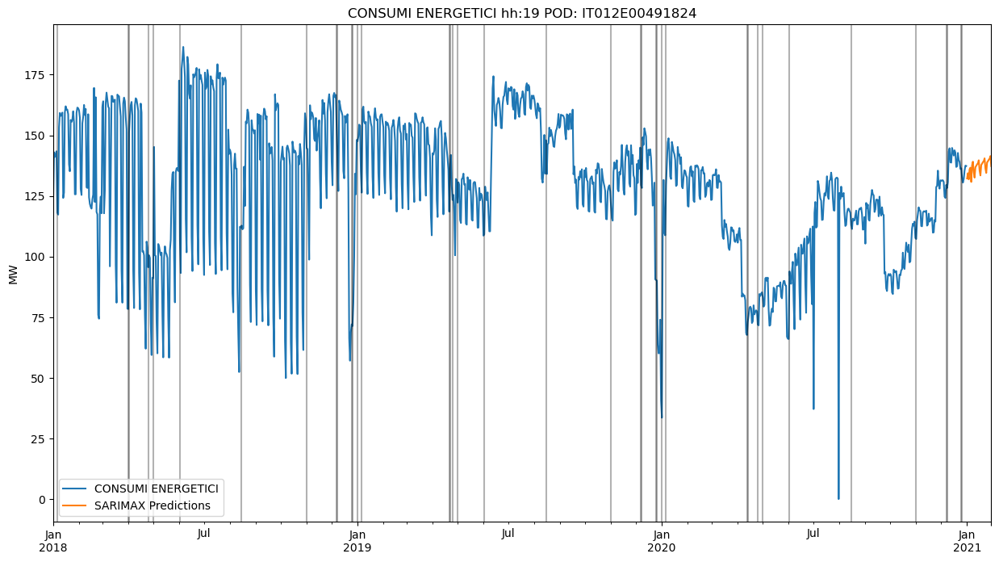

In [298]:
# Plot predictions against known values
title=f'CONSUMI ENERGETICI hh:{hour_fcast} POD: {POD_2}'
ylabel='MW'
xlabel=''
ax = df['CONSUMI ENERGETICI'].plot(legend=True,figsize=(15,8),title=title)
predictions.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel)
for x in df.query('dummy_holiday==1').index: 
    ax.axvline(x=x, color='k', alpha = 0.3);